<h1> Amazon Apparel Recommendations </h1>



In [1]:
from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import warnings
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
import math
import time
import re
import os
import seaborn as sns
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity  
from sklearn.metrics import pairwise_distances
from matplotlib import gridspec
from scipy.sparse import hstack
import plotly
import plotly.figure_factory as ff
from plotly.graph_objs import Scatter, Layout

plotly.offline.init_notebook_mode(connected=True)
warnings.filterwarnings("ignore")
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     /home/sudhanshu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [2]:
data = pd.read_json('tops_fashion.json')
data=data.iloc[:1000,:]

In [3]:
print ('Number of data points : ', data.shape[0], 
       'Number of features/variables:', data.shape[1])

Number of data points :  1000 Number of features/variables: 19


### Terminology:
What is a dataset? <br>
Rows and columns <br>
Data-point <br>
Feature/variable <br>







In [4]:
# each product/item has 19 features in the raw dataset.
data.columns 

Index(['sku', 'asin', 'product_type_name', 'formatted_price', 'author',
       'color', 'brand', 'publisher', 'availability', 'reviews',
       'large_image_url', 'availability_type', 'small_image_url',
       'editorial_review', 'title', 'model', 'medium_image_url',
       'manufacturer', 'editorial_reivew'],
      dtype='object')

Of these 19 features, we will be using only 6 features. \\
    1. asin  ( Amazon standard identification number) \\
    2. brand ( brand to which the product belongs to ) 
    3. color ( Color information of apparel, it can contain many colors as   a value ex: red and black stripes ) 
    4. product_type_name (type of the apperal, ex: SHIRT/TSHIRT )
    5. medium_image_url  ( url of the image )
    6. title (title of the product.)
    7. formatted_price (price of the product)

In [5]:
data = data[['asin', 'brand', 'color', 'medium_image_url', 'product_type_name', 'title', 'formatted_price']]

In [6]:
print ('Number of data points : ', data.shape[0], \
       'Number of features:', data.shape[1])
data.head() 

Number of data points :  1000 Number of features: 7


,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
0,B016I2TS4W,FNC7C,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Minions Como Superheroes Ironman Long Sleeve R...,None
1,B01N49AI08,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Izo Tunic,None
2,B01JDPCOHO,FIG Clothing,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,FIG Clothing Womens Won Top,None
3,B01N19U5H5,Focal18,None,https://images-na.ssl-images-amazon.com/images...,SHIRT,Focal18 Sailor Collar Bubble Sleeve Blouse Shi...,None
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26


### Missing data for various features.

####  Basic stats for the feature: product_type_name

In [7]:
print(data['product_type_name'].describe())

count      1000
unique       14
top       SHIRT
freq        925
Name: product_type_name, dtype: object


In [8]:
print(data['product_type_name'].unique())

['SHIRT' 'SWEATER' 'APPAREL' 'OUTDOOR_RECREATION_PRODUCT'
 'BOOKS_1973_AND_LATER' 'PANTS' 'HAT' 'SPORTING_GOODS' 'DRESS' 'UNDERWEAR'
 'SKIRT' 'OUTERWEAR' 'BRA' 'ACCESSORY']


In [9]:
# find the 10 most frequent product_type_names.
product_type_count = Counter(list(data['product_type_name']))
product_type_count.most_common(10)

[('SHIRT', 925),
 ('APPAREL', 24),
 ('BOOKS_1973_AND_LATER', 14),
 ('SWEATER', 10),
 ('DRESS', 8),
 ('SPORTING_GOODS', 6),
 ('OUTDOOR_RECREATION_PRODUCT', 5),
 ('UNDERWEAR', 2),
 ('PANTS', 1),
 ('HAT', 1)]

####  Basic stats for the feature: brand

In [10]:

print(data['brand'].describe())


count            1000
unique            135
top       Fashion2ne1
freq               37
Name: brand, dtype: object


In [11]:
brand_count = Counter(list(data['brand']))
brand_count.most_common(10)

[('Fashion2ne1', 37),
 ('FIFA', 36),
 ('FeatherLite', 32),
 ('Fila', 31),
 ('FineBrandShop', 30),
 ('Fashion Stream', 30),
 ('FDPlus', 29),
 ('Floerns', 28),
 ('Fashion Story', 28),
 ('FIFTEEN TWENTY', 27)]

####  Basic stats for the feature: color

In [12]:
print(data['color'].describe())


count       439
unique      133
top       Black
freq        116
Name: color, dtype: object


In [13]:
color_count = Counter(list(data['color']))
color_count.most_common(10)

[(None, 561),
 ('Black', 116),
 ('White', 53),
 ('Red', 33),
 ('Blue', 15),
 ('Grey', 10),
 ('Purple', 9),
 ('Multi', 8),
 ('Green', 7),
 ('Burgundy', 7)]

####  Basic stats for the feature: formatted_price

In [14]:
print(data['formatted_price'].describe())


count        179
unique        94
top       $16.99
freq          10
Name: formatted_price, dtype: object


In [15]:
price_count = Counter(list(data['formatted_price']))
price_count.most_common(10)

[(None, 821),
 ('$16.99', 10),
 ('$9.99', 9),
 ('$11.99', 6),
 ('$19.99', 6),
 ('$7.50', 5),
 ('$6.99', 5),
 ('$33.44', 5),
 ('$7.99', 5),
 ('$8.99', 5)]

#### Basic stats for the feature: title


In [16]:
print(data['title'].describe())



count                                                  1000
unique                                                  984
top       Fashion Story Women's Casual Oversized Long Ba...
freq                                                      4
Name: title, dtype: object


In [17]:
import os

# Create the 'pickels' folder if it doesn't exist
os.makedirs('pickels', exist_ok=True)

# Now you can safely save the pickle file
data.to_pickle('pickels/180k_apparel_data')


   We save data files at every major step in our processing in "pickel" files, just as a checkpoints for later downstream tasks.

In [18]:

data = data.loc[~data['formatted_price'].isnull()]
print('Number of data points After eliminating price=NULL :', data.shape[0])

Number of data points After eliminating price=NULL : 179


In [19]:

data =data.loc[~data['color'].isnull()]
print('Number of data points After eliminating color=NULL :', data.shape[0])

Number of data points After eliminating color=NULL : 179


In [20]:
data.to_pickle('pickels/28k_apparel_data')
print(len(data))


179


In [21]:
import pandas as pd
from PIL import Image
import requests
from io import BytesIO
import os

# Load your data
data = pd.read_pickle('pickels/28k_apparel_data')
print(len(data))

# Print column names for debugging
print("DataFrame columns:", data.columns)

# Base directory for saving images
base_dir = 'images/28k_images/'

# Loop through each row in the DataFrame
for index, row in data.iterrows():
    # Get the class label (you can modify this to use a different column if needed)
    class_label = row['product_type_name'].replace(" ", "_")  # Replace spaces with underscores for folder names
    class_dir = os.path.join(base_dir, class_label)

    # Create the class subdirectory if it doesn't exist
    if not os.path.exists(class_dir):
        os.makedirs(class_dir)

    # Download and save the image
    try:
        url = row['medium_image_url']  # Use the correct column name
        response = requests.get(url)
        img = Image.open(BytesIO(response.content))
        img.save(os.path.join(class_dir, row['asin'] + '.jpeg'))
    except KeyError as e:
        print(f"KeyError: {e} for index {index}. Check if the column names are correct.")
    except Exception as e:
        print(f"Error saving image for ASIN {row['asin']}: {e}")


179
DataFrame columns: Index(['asin', 'brand', 'color', 'medium_image_url', 'product_type_name',
       'title', 'formatted_price'],
      dtype='object')


###  Remove near duplicate items

In [22]:

data = pd.read_pickle('pickels/28k_apparel_data')

# find number of products that have duplicate titles.
print(sum(data.duplicated('title')))


10


#### In our data there are many duplicate products like the above examples, we need to de-dupe them for better results.


### Remove duplicates : Part 1

In [23]:

data = pd.read_pickle('pickels/28k_apparel_data')

In [24]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,Featherlite Ladies' Long Sleeve Stain Resistan...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,Women's Unique 100% Cotton T - Special Olympic...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,Ladies Cotton Tank 2x1 Ribbed Tank Top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,FeatherLite Ladies' Moisture Free Mesh Sport S...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,Supernatural Chibis Sam Dean And Castiel Short...,$7.50


In [25]:
# Remove All products with very few words in title
data_sorted = data[data['title'].apply(lambda x: len(x.split())>4)]
print("After removal of products with short description:", data_sorted.shape[0])

After removal of products with short description: 175


In [26]:

data_sorted.sort_values('title',inplace=True, ascending=False)
data_sorted.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
525,B075CG1KY3,YiRong Fashion T-Shirt,Brown,https://images-na.ssl-images-amazon.com/images...,SHIRT,YiRong Irregular loose round neckline of pure ...,$39.99
532,B01MCU7NG0,Fifth Degree,Blue,https://images-na.ssl-images-amazon.com/images...,SHIRT,Womens Plus Size Sweaters Long Sleeve Cowl Nec...,$13.99
726,B01MXS9W5W,Fifth Degree USA,Blue,https://images-na.ssl-images-amazon.com/images...,SHIRT,Womens Plus Size Long Sleeve Cowl Neck Loose T...,$34.99
997,B01MDLV4MA,Fifth Degree,Light Blue,https://images-na.ssl-images-amazon.com/images...,SHIRT,Womens In Vein Soft Cotton Rhinestone Printed ...,$14.99
663,B074LQB4TQ,FEIANNA,White,https://images-na.ssl-images-amazon.com/images...,APPAREL,Womens Casual Ethnic embroidery Pleated Long P...,$22.80


#### Some examples of dupliacte titles that differ only in the last few words.

<pre>
Titles 1:
16. woman's place is in the house and the senate shirts for Womens XXL White
17. woman's place is in the house and the senate shirts for Womens M Grey

Title 2:
25. tokidoki The Queen of Diamonds Women's Shirt X-Large
26. tokidoki The Queen of Diamonds Women's Shirt Small
27. tokidoki The Queen of Diamonds Women's Shirt Large

Title 3:
61. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
62. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
63. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
64. psychedelic colorful Howling Galaxy Wolf T-shirt/Colorful Rainbow Animal Print Head Shirt for woman Neon Wolf t-shirt
</pre>

In [27]:
indices = []
for i,row in data_sorted.iterrows():
    indices.append(i)

In [28]:
import itertools
stage1_dedupe_asins = []
i = 0
j = 0
num_data_points = data_sorted.shape[0]
while i < num_data_points and j < num_data_points:
    
    previous_i = i

    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    a = data['title'].loc[indices[i]].split()

    # search for the similar products sequentially 
    j = i+1
    while j < num_data_points:

        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'Small']
        b = data['title'].loc[indices[j]].split()

        # store the maximum length of two strings
        length = max(len(a), len(b))

        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0] == k[1]):
                count += 1

        # if the number of words in which both strings differ are > 2 , we are considering it as those two apperals are different
        # if the number of words in which both strings differ are < 2 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) > 2: # number of words in which both sensences differ
            # if both strings are differ by more than 2 words we include the 1st string index
            stage1_dedupe_asins.append(data_sorted['asin'].loc[indices[i]])


            # start searching for similar apperals corresponds 2nd string
            i = j
            break
        else:
            j += 1
    if previous_i == i:
        break

In [29]:
data = data.loc[data['asin'].isin(stage1_dedupe_asins)]

#### We removed  the dupliactes which differ only at the end.

In [30]:
print('Number of data points : ', data.shape[0])

Number of data points :  130


In [31]:
data.to_pickle('pickels/17k_apperal_data')

#### [5.2.3] Remove duplicates : Part 2



In the previous cell, we sorted whole data in alphabetical order of  titles.Then, we removed titles which are adjacent and very similar title

But there are some products whose titles are not adjacent but very similar.

Examples:

Titles-1
86261.  UltraClub Women's Classic Wrinkle-Free Long Sleeve Oxford Shirt, Pink, XX-Large
115042. UltraClub Ladies Classic Wrinkle-Free Long-Sleeve Oxford Light Blue XXL

TItles-2
75004.  EVALY Women's Cool University Of UTAH 3/4 Sleeve Raglan Tee
109225. EVALY Women's Unique University Of UTAH 3/4 Sleeve Raglan Tees
120832. EVALY Women's New University Of UTAH 3/4-Sleeve Raglan Tshirt



In [32]:
data = pd.read_pickle('pickels/17k_apperal_data')

In [33]:


indices = []
for i,row in data.iterrows():
    indices.append(i)

stage2_dedupe_asins = []
while len(indices)!=0:
    i = indices.pop()
    stage2_dedupe_asins.append(data['asin'].loc[i])
    # consider the first apperal's title
    a = data['title'].loc[i].split()
    # store the list of words of ith string in a, ex: a = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
    for j in indices:
        
        b = data['title'].loc[j].split()
        # store the list of words of jth string in b, ex: b = ['tokidoki', 'The', 'Queen', 'of', 'Diamonds', 'Women's', 'Shirt', 'X-Large']
        
        length = max(len(a),len(b))
        
        # count is used to store the number of words that are matched in both strings
        count  = 0

        # itertools.zip_longest(a,b): will map the corresponding words in both strings, it will appened None in case of unequal strings
        # example: a =['a', 'b', 'c', 'd']
        # b = ['a', 'b', 'd']
        # itertools.zip_longest(a,b): will give [('a','a'), ('b','b'), ('c','d'), ('d', None)]
        for k in itertools.zip_longest(a,b): 
            if (k[0]==k[1]):
                count += 1

        # if the number of words in which both strings differ are < 3 , we are considering it as those two apperals are same, hence we are ignoring them
        if (length - count) < 3:
            indices.remove(j)

In [34]:

data = data.loc[data['asin'].isin(stage2_dedupe_asins)]

In [35]:
print('Number of data points after stage two of dedupe: ',data.shape[0])

Number of data points after stage two of dedupe:  123


In [36]:
data.to_pickle('pickels/16k_apperal_data')

# 6. Text pre-processing

In [37]:
data = pd.read_pickle('pickels/16k_apperal_data')
print(data.shape)

(123, 7)


In [38]:
# we use the list of stop words that are downloaded from nltk lib.
stop_words = set(stopwords.words('english'))
print ('list of stop words:', stop_words)

def nlp_preprocessing(total_text, index, column):
    if type(total_text) is not int:
        string = ""
        for words in total_text.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data[column][index] = string

list of stop words: {'during', 'when', 'd', 'were', 'shan', 'or', 'now', "should've", "aren't", "you've", "shouldn't", 'too', 'before', 'his', 'wouldn', 'such', "didn't", 'by', 'and', 'there', 'don', 'ourselves', 'ours', 'mustn', 'll', 'some', 'if', 'under', 'why', 'our', 's', 'these', 'as', 'from', 'they', 'ain', "isn't", 'my', 'in', 'here', 'myself', 'are', 'he', 'with', 'shouldn', 'am', 'few', "hadn't", 'being', 'is', "haven't", 'because', 'who', 'having', 'that', "shan't", 'the', 'should', 'out', 'its', 'further', "doesn't", 'to', 'yourselves', 'between', 'each', 'all', 're', 'does', 'did', 'what', 'be', 'hasn', 'other', 'up', 've', "she's", 'at', 'themselves', 'which', 'any', 'have', 'doesn', 'isn', 'down', "it's", 'only', "you'd", 'has', 'm', 'over', 'didn', 'those', 'wasn', 'a', "weren't", 'we', 'aren', 'where', 'your', 'them', 'but', 'ma', 'yourself', 'more', 'for', "mightn't", 'just', 'you', "mustn't", 'whom', 'above', 'no', 'can', "don't", "hasn't", 'herself', 'about', 'i', '

In [39]:

# we take each title and we text-preprocess it.
for index, row in data.iterrows():
    nlp_preprocessing(row['title'], index, 'title')



In [40]:
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,ladies cotton tank 2x1 ribbed tank top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel short sle...,$7.50


In [41]:
data.to_pickle('pickels/16k_apperal_data_preprocessed')

#  Text based product similarity

In [42]:
data = pd.read_pickle('pickels/16k_apperal_data_preprocessed')
data.head()

,asin,brand,color,medium_image_url,product_type_name,title,formatted_price
4,B004GSI2OS,FeatherLite,Onyx Black/ Stone,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies long sleeve stain resistant...,$26.26
6,B012YX2ZPI,HX-Kingdom Fashion T-shirts,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,womens unique 100 cotton special olympics wor...,$9.99
11,B001LOUGE4,Fitness Etc.,Black,https://images-na.ssl-images-amazon.com/images...,SHIRT,ladies cotton tank 2x1 ribbed tank top,$11.99
15,B003BSRPB0,FeatherLite,White,https://images-na.ssl-images-amazon.com/images...,SHIRT,featherlite ladies moisture free mesh sport sh...,$20.54
21,B014ICEDNA,FNC7C,Purple,https://images-na.ssl-images-amazon.com/images...,SHIRT,supernatural chibis sam dean castiel short sle...,$7.50


In [43]:

#Display an image
def display_img(url,ax,fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook 
    plt.imshow(img)
  
#plotting code to understand the algorithm's decision.
def plot_heatmap(keys, values, labels, url, text):
        # keys: list of words of recommended title
        # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
        # labels: len(labels) == len(keys), the values of labels depends on the model we are using
                # if model == 'bag of words': labels(i) = values(i)
                # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
                # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))
        # url : apparel's url

        # we will devide the whole figure into two parts
        gs = gridspec.GridSpec(2, 2, width_ratios=[4,1], height_ratios=[4,1]) 
        fig = plt.figure(figsize=(25,3))
        
        # 1st, ploting heat map that represents the count of commonly ocurred words in title2
        ax = plt.subplot(gs[0])
        # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
        ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
        ax.set_xticklabels(keys) # set that axis labels as the words of title
        ax.set_title(text) # apparel title
        
        # 2nd, plotting image of the the apparel
        ax = plt.subplot(gs[1])
        # we don't want any grid lines for image and no labels on x-axis and y-axis
        ax.grid(False)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # we call dispaly_img based with paramete url
        display_img(url, ax, fig)
        
        # displays combine figure ( heat map and image together)
        plt.show()
    
def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title1
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models, 
        # 1. bag_of_words
        # 2. tfidf
        # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys()) 

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i]=0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0 
    values = [vec2[x] for x in vec2.keys()]
    
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
        # if model == 'bag of words': labels(i) = values(i)
        # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))
        # if model == 'idf weighted bag of words':labels(i) = idf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in  tfidf_title_vectorizer.vocabulary_:
                labels.append(tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)
    elif model == 'idf':
        labels = []
        for x in vec2.keys():
            # idf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # idf_title_features[doc_id, index_of_word_in_corpus] will give the idf value of word in given document (doc_id)
            if x in  idf_title_vectorizer.vocabulary_:
                labels.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)


def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)

    return Counter(words) 



def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b
    
    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)

## [8.2] Bag of Words (BoW) on product titles.

In [44]:
from sklearn.feature_extraction.text import CountVectorizer
title_vectorizer = CountVectorizer()
title_features   = title_vectorizer.fit_transform(data['title'])
title_features.get_shape() 
# title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(corpus) returns 
# the a sparase matrix of dimensions #data_points * #words_in_corpus

# title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc



(123, 414)

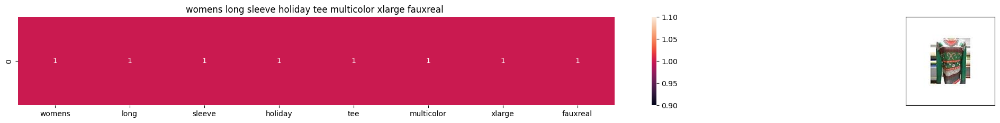

ASIN : B07228YJ3J
Brand: Faux Real
Title: womens long sleeve holiday tee multicolor xlarge fauxreal 
Euclidean similarity with the query image : 0.0


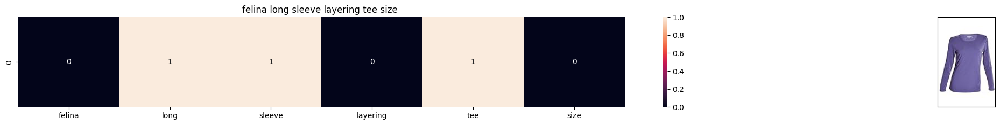

ASIN : B01D5J5IR2
Brand: Filina
Title: felina long sleeve layering tee size 
Euclidean similarity with the query image : 2.8284271247461903


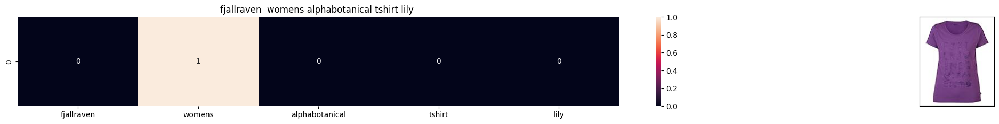

ASIN : B073WKCX36
Brand: Fjallraven
Title: fjallraven  womens alphabotanical tshirt lily 
Euclidean similarity with the query image : 3.3166247903554


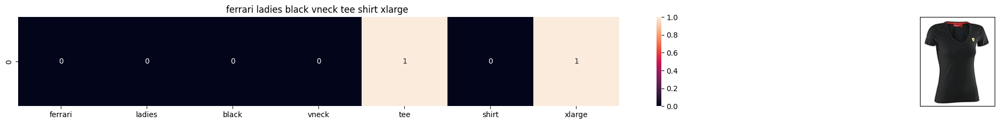

ASIN : B01EZ6XKR4
Brand: Ferrari
Title: ferrari ladies black vneck tee shirt xlarge 
Euclidean similarity with the query image : 3.3166247903554


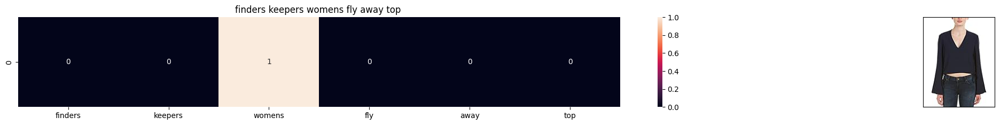

ASIN : B01N3SAT0R
Brand: findersKEEPERS
Title: finders keepers womens fly away top 
Euclidean similarity with the query image : 3.4641016151377544


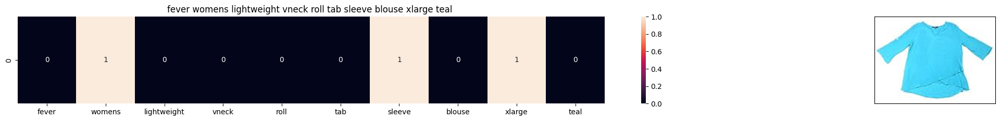

ASIN : B06XRTQTL6
Brand: Fever
Title: fever womens lightweight vneck roll tab sleeve blouse xlarge teal 
Euclidean similarity with the query image : 3.4641016151377544


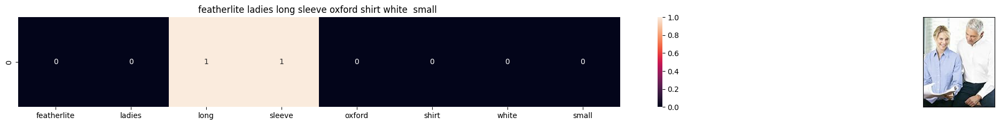

ASIN : B003BSQPX4
Brand: FeatherLite
Title: featherlite ladies long sleeve oxford shirt white  small 
Euclidean similarity with the query image : 3.4641016151377544


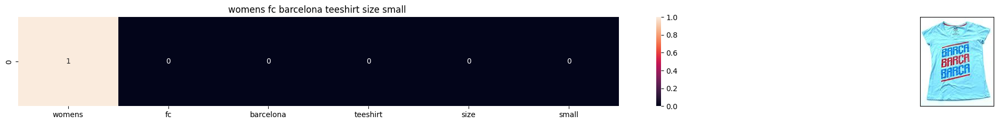

ASIN : B073WBRZVZ
Brand: FCB
Title: womens fc barcelona teeshirt size small 
Euclidean similarity with the query image : 3.4641016151377544


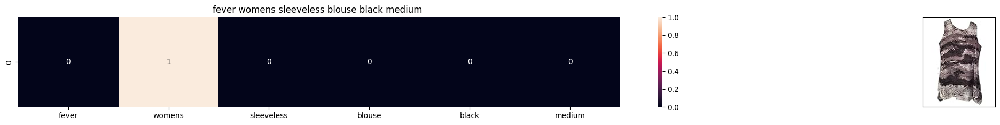

ASIN : B01M1LYNLA
Brand: Fever
Title: fever womens sleeveless blouse black medium 
Euclidean similarity with the query image : 3.4641016151377544


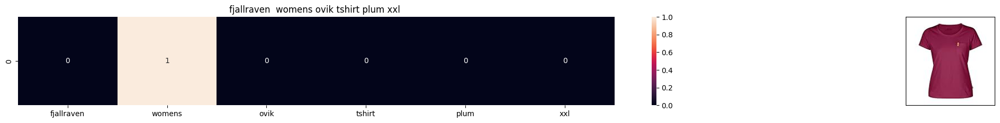

ASIN : B06XC3CZF6
Brand: Fjallraven
Title: fjallraven  womens ovik tshirt plum xxl 
Euclidean similarity with the query image : 3.4641016151377544


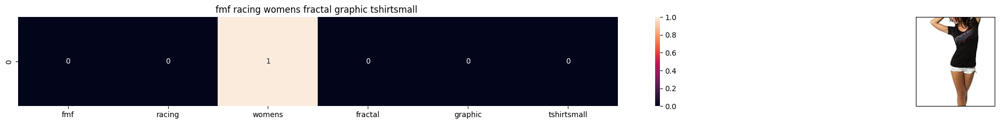

ASIN : B00KIC7WNS
Brand: FMF
Title: fmf racing womens fractal graphic tshirtsmall 
Euclidean similarity with the query image : 3.4641016151377544


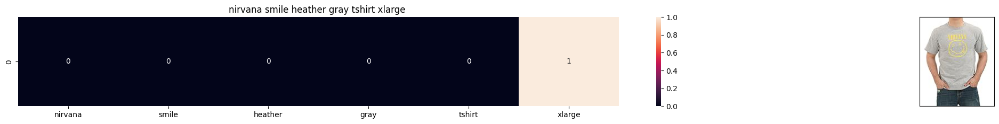

ASIN : B00VVG2YNS
Brand: FEA Merchandising
Title: nirvana smile heather gray tshirt xlarge 
Euclidean similarity with the query image : 3.4641016151377544


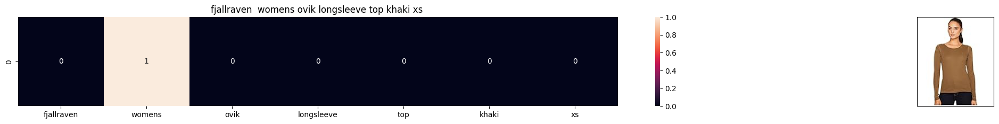

ASIN : B01N21KZNT
Brand: Fjallraven
Title: fjallraven  womens ovik longsleeve top khaki xs 
Euclidean similarity with the query image : 3.605551275463989


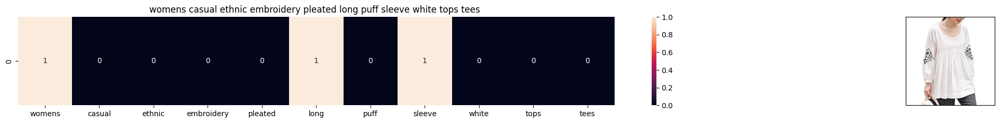

ASIN : B074LQB4TQ
Brand: FEIANNA
Title: womens casual ethnic embroidery pleated long puff sleeve white tops tees 
Euclidean similarity with the query image : 3.605551275463989


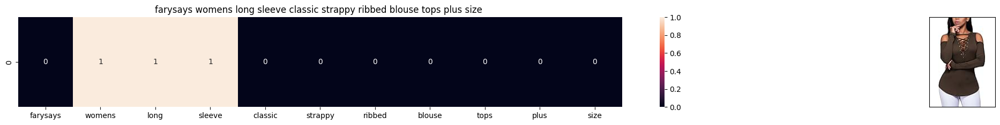

ASIN : B01MQD2T92
Brand: FARYSAYS
Title: farysays womens long sleeve classic strappy ribbed blouse tops plus size 
Euclidean similarity with the query image : 3.605551275463989


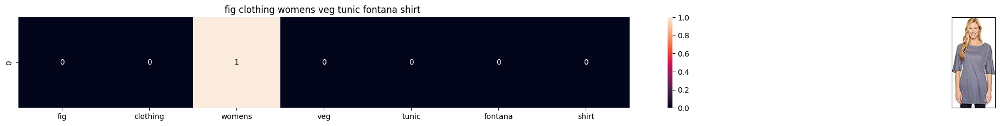

ASIN : B01J9DRRYU
Brand: FIG Clothing
Title: fig clothing womens veg tunic fontana shirt 
Euclidean similarity with the query image : 3.605551275463989


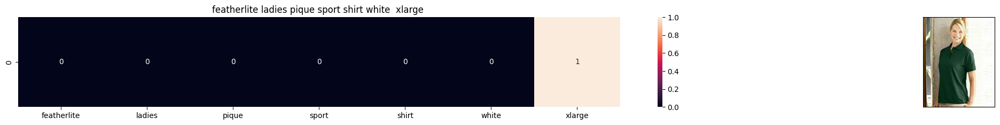

ASIN : B003BSQ1YM
Brand: FeatherLite
Title: featherlite ladies pique sport shirt white  xlarge 
Euclidean similarity with the query image : 3.605551275463989


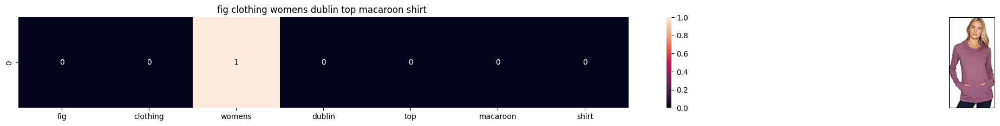

ASIN : B01MU4SW99
Brand: FIG Clothing
Title: fig clothing womens dublin top macaroon shirt 
Euclidean similarity with the query image : 3.605551275463989


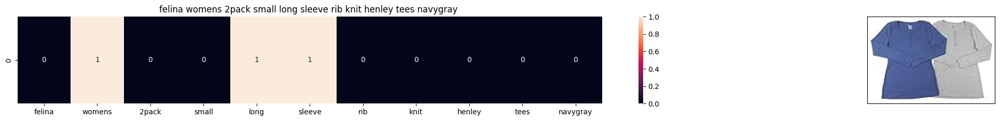

ASIN : B06ZY41SMQ
Brand: Felina
Title: felina womens 2pack small long sleeve rib knit henley tees navygray 
Euclidean similarity with the query image : 3.605551275463989


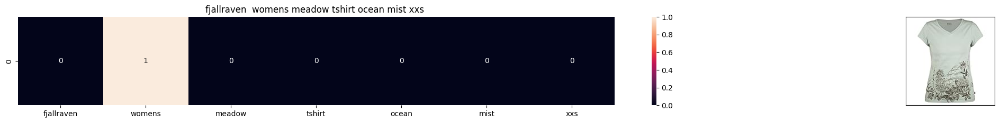

ASIN : B06XD6PH8W
Brand: Fjallraven
Title: fjallraven  womens meadow tshirt ocean mist xxs 
Euclidean similarity with the query image : 3.605551275463989


In [45]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(title_features,title_features[doc_id])
    
    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    
    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print ('Brand:', data['brand'].loc[df_indices[i]])
        print ('Title:', data['title'].loc[df_indices[i]])
        print ('Euclidean similarity with the query image :', pdists[i])
        print('='*60)

#call the bag-of-words model for a product to get similar products.
bag_of_words_model(100, 20) 
# In the output heat map each value represents the count value 
# of the label word, the color represents the intersection 
# with inputs title.

## TF-IDF based product similarity

In [46]:
tfidf_title_vectorizer = TfidfVectorizer(min_df = 1)
tfidf_title_features = tfidf_title_vectorizer.fit_transform(data['title'])
# tfidf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# tfidf_title_features[doc_id, index_of_word_in_corpus] = tfidf values of the word in given doc

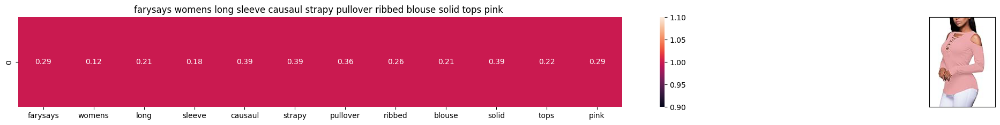

ASIN : B01MRE4Q1O
BRAND : FARYSAYS
Eucliden distance from the given image : 0.0


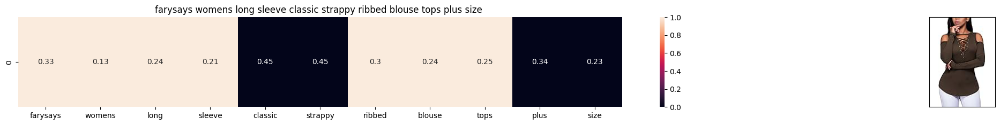

ASIN : B01MQD2T92
BRAND : FARYSAYS
Eucliden distance from the given image : 1.1143251618387862


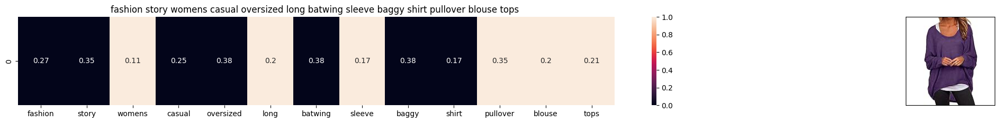

ASIN : B074K8M65J
BRAND : Fashion Story
Eucliden distance from the given image : 1.183308738376379


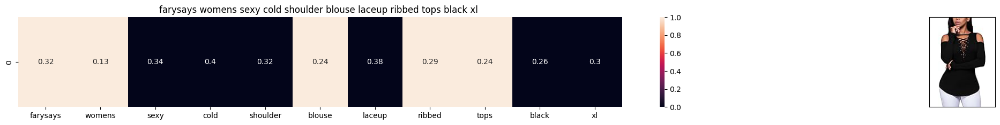

ASIN : B01M4R97JB
BRAND : FARYSAYS
Eucliden distance from the given image : 1.1966919451854425


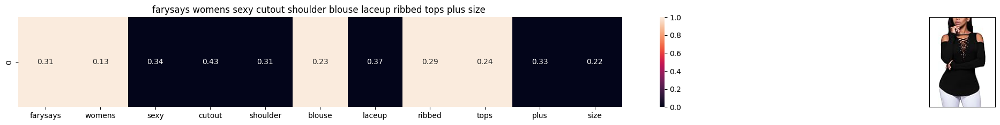

ASIN : B01M9J1FJC
BRAND : FARYSAYS
Eucliden distance from the given image : 1.1998154430748793


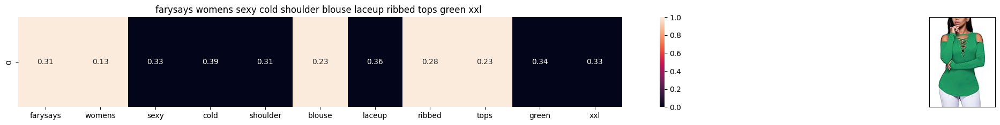

ASIN : B01M7XNEW5
BRAND : FARYSAYS
Eucliden distance from the given image : 1.2062665840065994


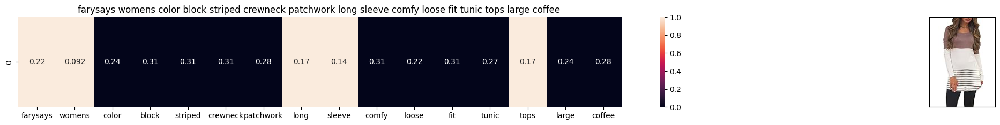

ASIN : B01N1Z7JB7
BRAND : FARYSAYS
Eucliden distance from the given image : 1.28736644655793


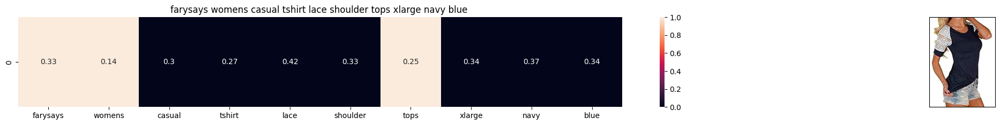

ASIN : B0717BMMV8
BRAND : FARYSAYS
Eucliden distance from the given image : 1.293699980982314


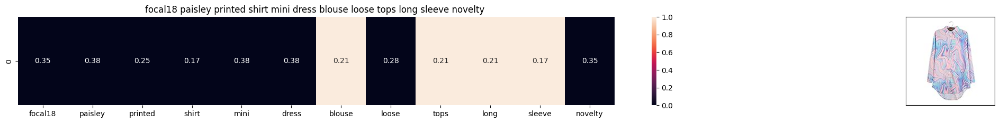

ASIN : B06W56V2N6
BRAND : Focal18
Eucliden distance from the given image : 1.2939128665137714


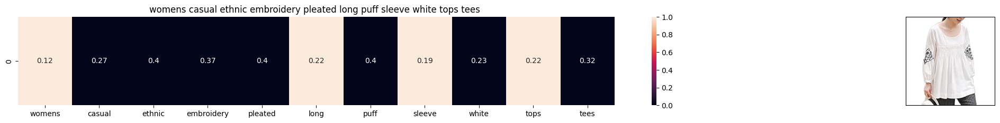

ASIN : B074LQB4TQ
BRAND : FEIANNA
Eucliden distance from the given image : 1.310208176968731


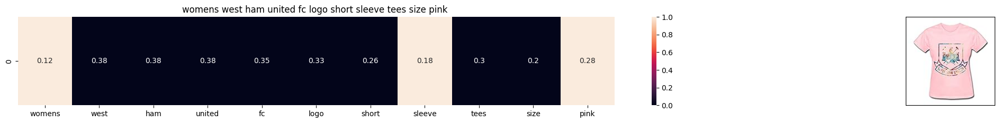

ASIN : B015K88D78
BRAND : Fire-Dog-Custom Tees
Eucliden distance from the given image : 1.3225647619948122


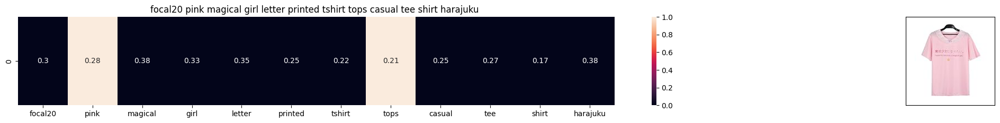

ASIN : B06XD96QDW
BRAND : Focal20
Eucliden distance from the given image : 1.3239734573085915


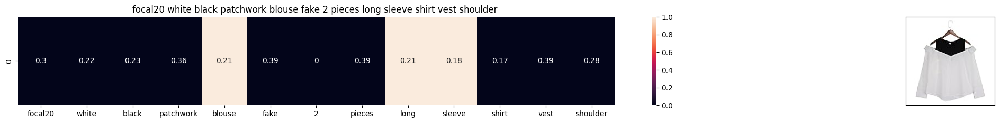

ASIN : B071HLXV6M
BRAND : Focal20
Eucliden distance from the given image : 1.3263016380544146


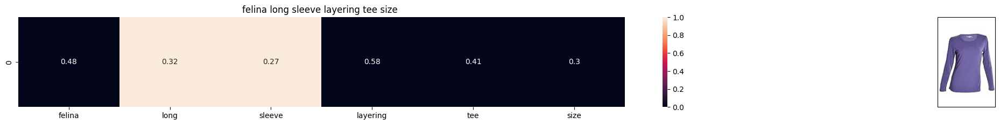

ASIN : B01D5J5IR2
BRAND : Filina
Eucliden distance from the given image : 1.330454110353654


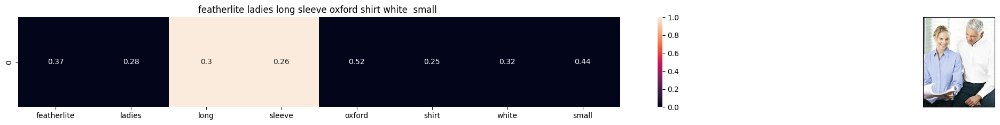

ASIN : B003BSQPX4
BRAND : FeatherLite
Eucliden distance from the given image : 1.3335365791021454


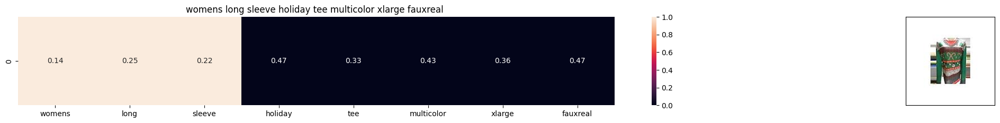

ASIN : B07228YJ3J
BRAND : Faux Real
Eucliden distance from the given image : 1.3346367991373487


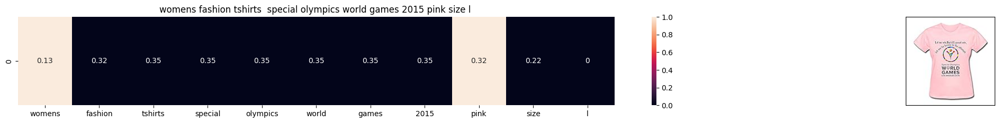

ASIN : B012YX26Q6
BRAND : HX-Kingdom Fashion T-shirts
Eucliden distance from the given image : 1.3359545243038777


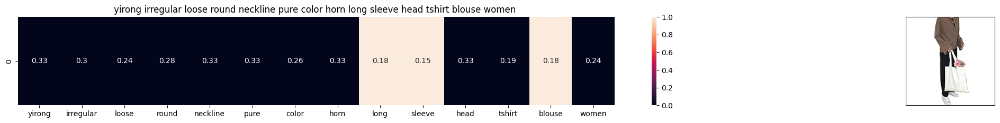

ASIN : B075CG1KY3
BRAND : YiRong Fashion T-Shirt
Eucliden distance from the given image : 1.3405717741911456


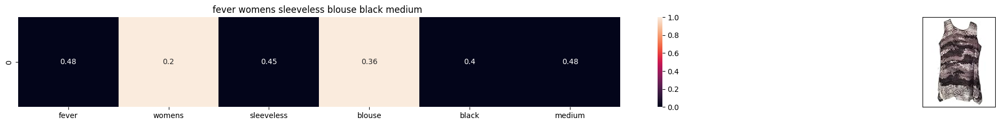

ASIN : B01M1LYNLA
BRAND : Fever
Eucliden distance from the given image : 1.3422829808502026


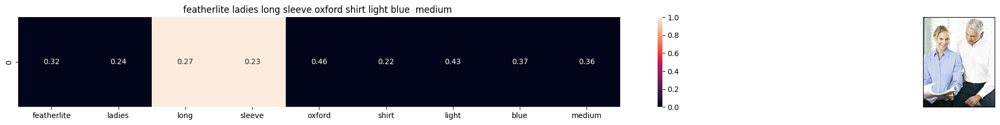

ASIN : B003BSSIVG
BRAND : FeatherLite
Eucliden distance from the given image : 1.343363804711855


In [47]:
def tfidf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(tfidf_title_features,tfidf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'tfidf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('BRAND :',data['brand'].loc[df_indices[i]])
        print ('Eucliden distance from the given image :', pdists[i])
        print('='*125)
tfidf_model(120, 20)
# in the output heat map each value represents the tfidf values of the label word, the color represents the intersection with inputs title

## [8.5] IDF based product similarity

In [48]:
idf_title_vectorizer = CountVectorizer()
idf_title_features = idf_title_vectorizer.fit_transform(data['title'])

# idf_title_features.shape = #data_points * #words_in_corpus
# CountVectorizer().fit_transform(courpus) returns the a sparase matrix of dimensions #data_points * #words_in_corpus
# idf_title_features[doc_id, index_of_word_in_corpus] = number of times the word occured in that doc

In [49]:
def n_containing(word):
    # return the number of documents which had the given word
    return sum(1 for blob in data['title'] if word in blob.split())

def idf(word):
    # idf = log(#number of docs / #number of docs which had the given word)
    return math.log(data.shape[0] / (n_containing(word)))

In [50]:
# we need to convert the values into float
idf_title_features  = idf_title_features.astype(float)

for i in idf_title_vectorizer.vocabulary_.keys():
    # for every word in whole corpus we will find its idf value
    idf_val = idf(i)
    
    # to calculate idf_title_features we need to replace the count values with the idf values of the word
    # idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0] will return all documents in which the word i present
    for j in idf_title_features[:, idf_title_vectorizer.vocabulary_[i]].nonzero()[0]:
        
        # we replace the count values of word i in document j with  idf_value of word i 
        # idf_title_features[doc_id, index_of_word_in_courpus] = idf value of word
        idf_title_features[j,idf_title_vectorizer.vocabulary_[i]] = idf_val
        

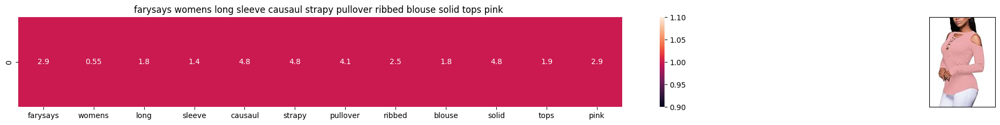

ASIN : B01MRE4Q1O
Brand : FARYSAYS
euclidean distance from the given image : 0.0


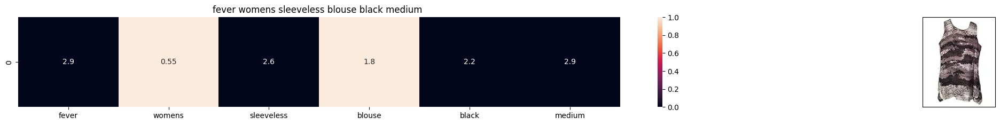

ASIN : B01M1LYNLA
Brand : Fever
euclidean distance from the given image : 12.07666824385367


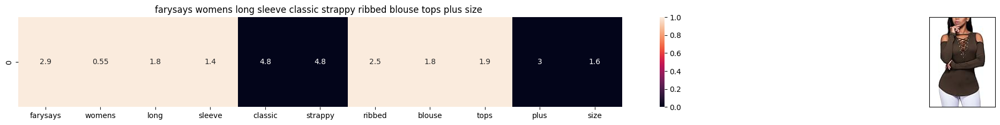

ASIN : B01MQD2T92
Brand : FARYSAYS
euclidean distance from the given image : 12.359649488937704


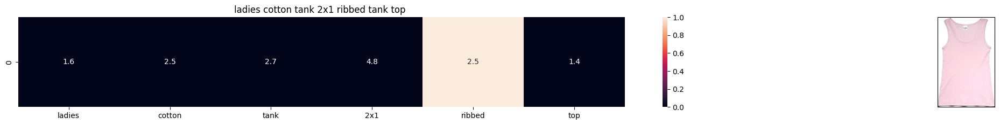

ASIN : B001LOUGE4
Brand : Fitness Etc.
euclidean distance from the given image : 12.513341328264062


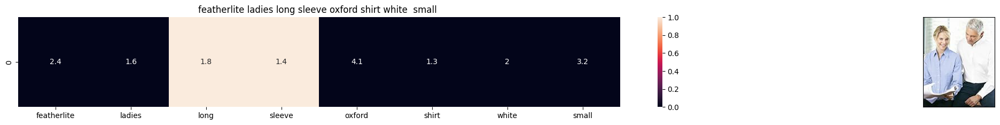

ASIN : B003BSQPX4
Brand : FeatherLite
euclidean distance from the given image : 12.54171416615614


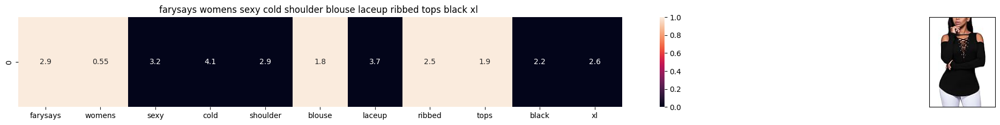

ASIN : B01M4R97JB
Brand : FARYSAYS
euclidean distance from the given image : 12.674500719645133


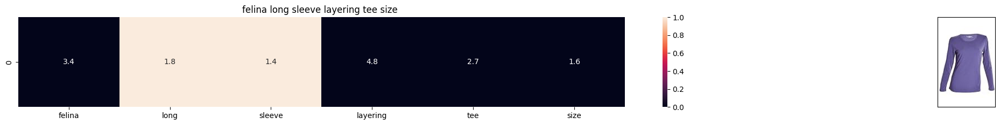

ASIN : B01D5J5IR2
Brand : Filina
euclidean distance from the given image : 12.699960577737668


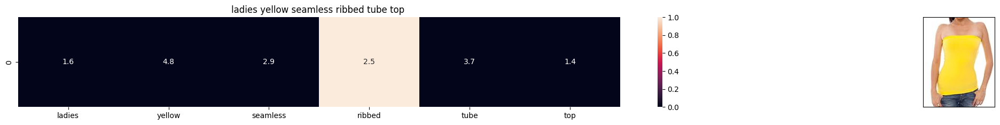

ASIN : B009286MFS
Brand : FineBrandShop
euclidean distance from the given image : 12.838375472563815


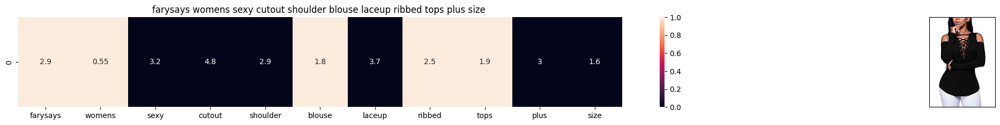

ASIN : B01M9J1FJC
Brand : FARYSAYS
euclidean distance from the given image : 12.925419639985488


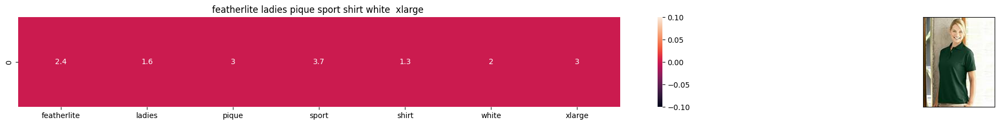

ASIN : B003BSQ1YM
Brand : FeatherLite
euclidean distance from the given image : 12.93468276506477


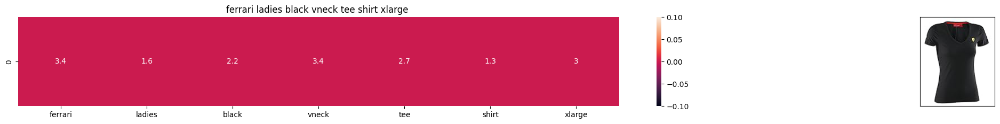

ASIN : B01EZ6XKR4
Brand : Ferrari
euclidean distance from the given image : 13.050330458224213


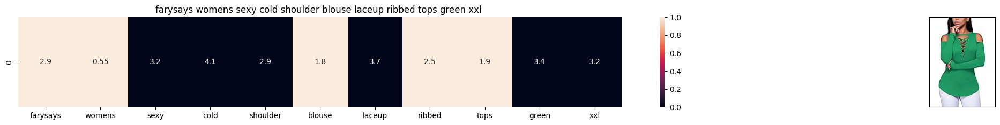

ASIN : B01M7XNEW5
Brand : FARYSAYS
euclidean distance from the given image : 13.079632250638218


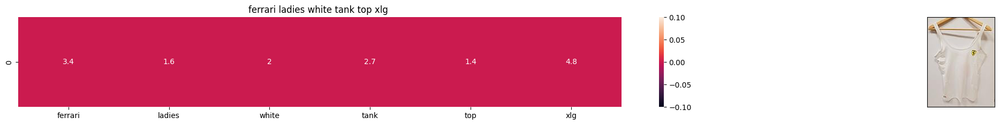

ASIN : B001HWXGYC
Brand : Ferrari
euclidean distance from the given image : 13.123900323988707


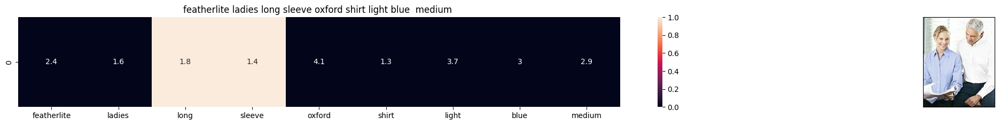

ASIN : B003BSSIVG
Brand : FeatherLite
euclidean distance from the given image : 13.2003710174155


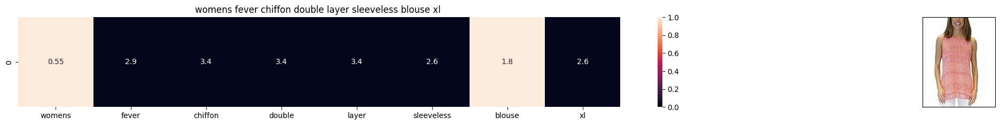

ASIN : B0723HCKXM
Brand : Fever
euclidean distance from the given image : 13.22709674778009


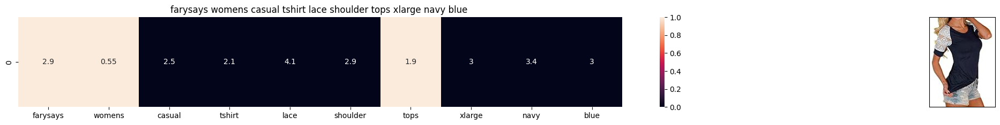

ASIN : B0717BMMV8
Brand : FARYSAYS
euclidean distance from the given image : 13.24160040809532


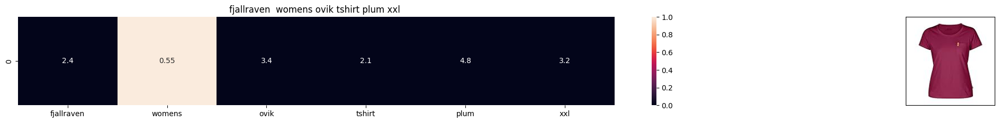

ASIN : B06XC3CZF6
Brand : Fjallraven
euclidean distance from the given image : 13.287643142754577


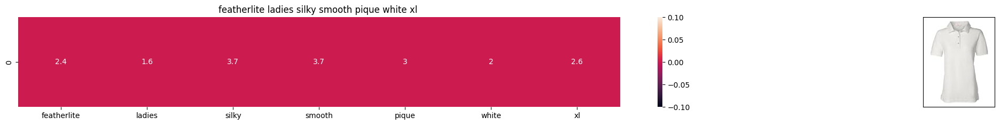

ASIN : B0079BMKDS
Brand : FeatherLite
euclidean distance from the given image : 13.310084182740407


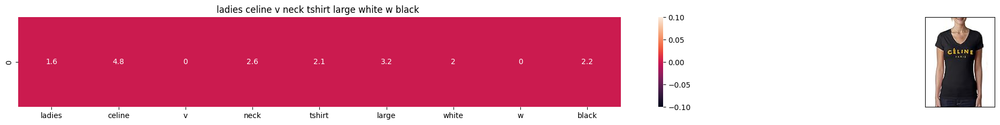

ASIN : B015S1TSNU
Brand : Fashion Place 4 Less
euclidean distance from the given image : 13.31127012544012


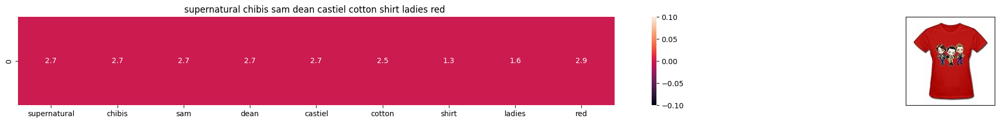

ASIN : B014ICC10C
Brand : FNC7C
euclidean distance from the given image : 13.3183100439651


In [51]:
def idf_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    # the metric we used here is cosine, the coside distance is mesured as K(X, Y) = <X, Y> / (||X||*||Y||)
    pairwise_dist = pairwise_distances(idf_title_features,idf_title_features[doc_id])

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])

    for i in range(0,len(indices)):
        get_result(indices[i],data['title'].loc[df_indices[0]], data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], 'idf')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print ('euclidean distance from the given image :', pdists[i])
        print('='*125)

        
        
idf_model(120,20)
# in the output heat map each value represents the idf values of the label word, the color represents the intersection with inputs title

# [9] Text Semantics based product similarity

In [52]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

model = KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin', binary=True)

# #if you do NOT have RAM >= 12GB, use the code below.

# with open('word2vec_model', 'rb') as handle:
#     model = pickle.load(handle)


In [53]:


def get_word_vec(sentence, doc_id, m_name):
    # sentence : title of the apparel
    # doc_id: document id in our corpus
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)
    vec = []
    for i in sentence.split():
        if i in vocab:
            if m_name == 'weighted' and i in  idf_title_vectorizer.vocabulary_:
                vec.append(idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[i]] * model[i])
            elif m_name == 'avg':
                vec.append(model[i])
        else:
            # if the word in our courpus is not there in the google word2vec corpus, we are just ignoring it
            vec.append(np.zeros(shape=(300,)))
    # we will return a numpy array of shape (#number of words in title * 300 ) 300 = len(w2v_model[word])
    # each row represents the word2vec representation of each word (weighted/avg) in given sentance 
    return  np.array(vec)

def get_distance(vec1, vec2):
    # vec1 = np.array(#number_of_words_title1 * 300), each row is a vector of length 300 corresponds to each word in give title
    # vec2 = np.array(#number_of_words_title2 * 300), each row is a vector of length 300 corresponds to each word in give title
    
    final_dist = []
    # for each vector in vec1 we caluclate the distance(euclidean) to all vectors in vec2
    for i in vec1:
        dist = []
        for j in vec2:
            # np.linalg.norm(i-j) will result the euclidean distance between vectors i, j
            dist.append(np.linalg.norm(i-j))
        final_dist.append(np.array(dist))
    # final_dist = np.array(#number of words in title1 * #number of words in title2)
    # final_dist[i,j] = euclidean distance between vectors i, j
    return np.array(final_dist)


def heat_map_w2v(sentence1, sentence2, url, doc_id1, doc_id2, model):
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # model: it can have two values, 1. avg 2. weighted
    
    #s1_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s1_vec = get_word_vec(sentence1, doc_id1, model)
    #s2_vec = np.array(#number_of_words_title1 * 300), each row is a vector(weighted/avg) of length 300 corresponds to each word in give title
    s2_vec = get_word_vec(sentence2, doc_id2, model)

    # s1_s2_dist = np.array(#number of words in title1 * #number of words in title2)
    # s1_s2_dist[i,j] = euclidean distance between words i, j
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    
    
    # devide whole figure into 2 parts 1st part displays heatmap 2nd part displays image of apparel
    gs = gridspec.GridSpec(2, 2, width_ratios=[4,1],height_ratios=[2,1]) 
    fig = plt.figure(figsize=(15,15))
    
    ax = plt.subplot(gs[0])
    # ploting the heap map based on the pairwise distances
    ax = sns.heatmap(np.round(s1_s2_dist,4), annot=True)
    # set the x axis labels as recommended apparels title
    ax.set_xticklabels(sentence2.split())
    # set the y axis labels as input apparels title
    ax.set_yticklabels(sentence1.split())
    # set title as recommended apparels title
    ax.set_title(sentence2)
    
    ax = plt.subplot(gs[1])
    # we remove all grids and axis labels for image
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])
    display_img(url, ax, fig)
    
    plt.show()

In [54]:
# vocab = stores all the words that are there in google w2v model

# vocab = model.keys()
# vocab = stores all the words that are in google's word2vec model
vocab = model.index_to_key

# this function will add the vectors of each word and returns the avg vector of given sentance
def build_avg_vec(sentence, num_features, doc_id, m_name):
    # sentace: its title of the apparel
    # num_features: the lenght of word2vec vector, its values = 300
    # m_name: model information it will take two values
        # if  m_name == 'avg', we will append the model[i], w2v representation of word i
        # if m_name == 'weighted', we will multiply each w2v[word] with the idf(word)

    featureVec = np.zeros((num_features,), dtype="float32")
    # we will intialize a vector of size 300 with all zeros
    # we add each word2vec(wordi) to this fetureVec
    nwords = 0
    
    for word in sentence.split():
        nwords += 1
        if word in vocab:
            if m_name == 'weighted' and word in  idf_title_vectorizer.vocabulary_:
                featureVec = np.add(featureVec, idf_title_features[doc_id, idf_title_vectorizer.vocabulary_[word]] * model[word])
            elif m_name == 'avg':
                featureVec = np.add(featureVec, model[word])
    if(nwords>0):
        featureVec = np.divide(featureVec, nwords)
    # returns the avg vector of given sentance, its of shape (1, 300)
    return featureVec

### Average Word2Vec product similarity.

In [55]:
doc_id = 0
w2v_title = []
# for every title we build a avg vector representation
for i in data['title']:
    w2v_title.append(build_avg_vec(i, 300, doc_id,'avg'))
    doc_id += 1

# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title = np.array(w2v_title)


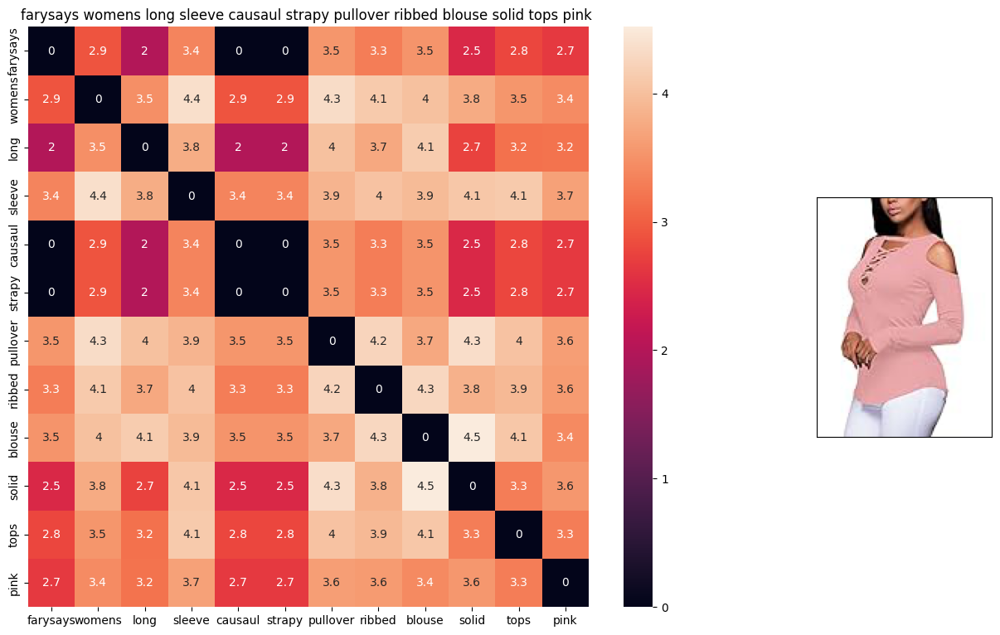

ASIN: B01MRE4Q1O
BRAND: FARYSAYS
Euclidean distance from given input image: 0.0


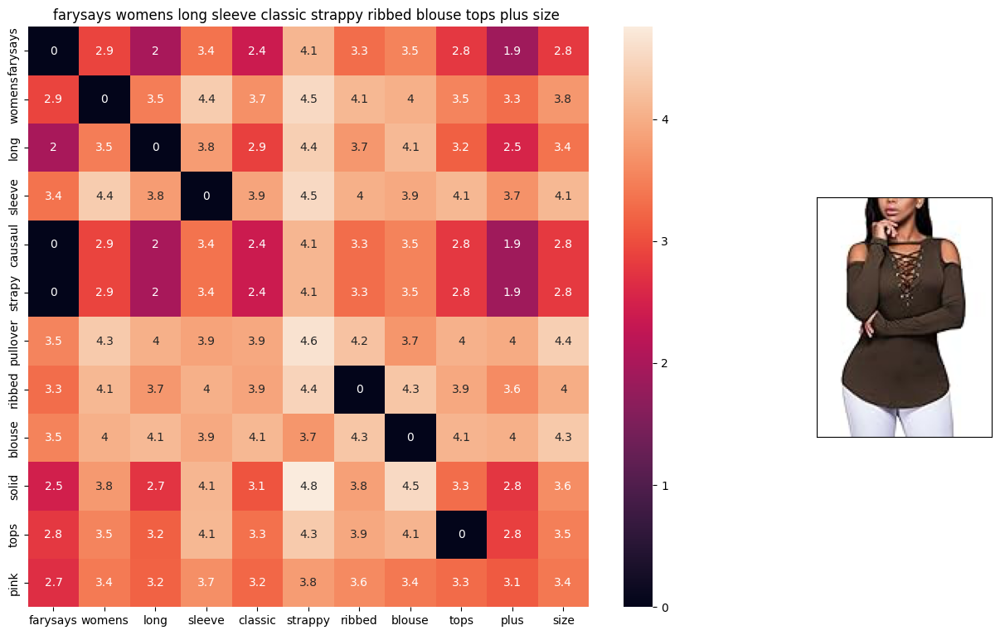

ASIN: B01MQD2T92
BRAND: FARYSAYS
Euclidean distance from given input image: 0.595645


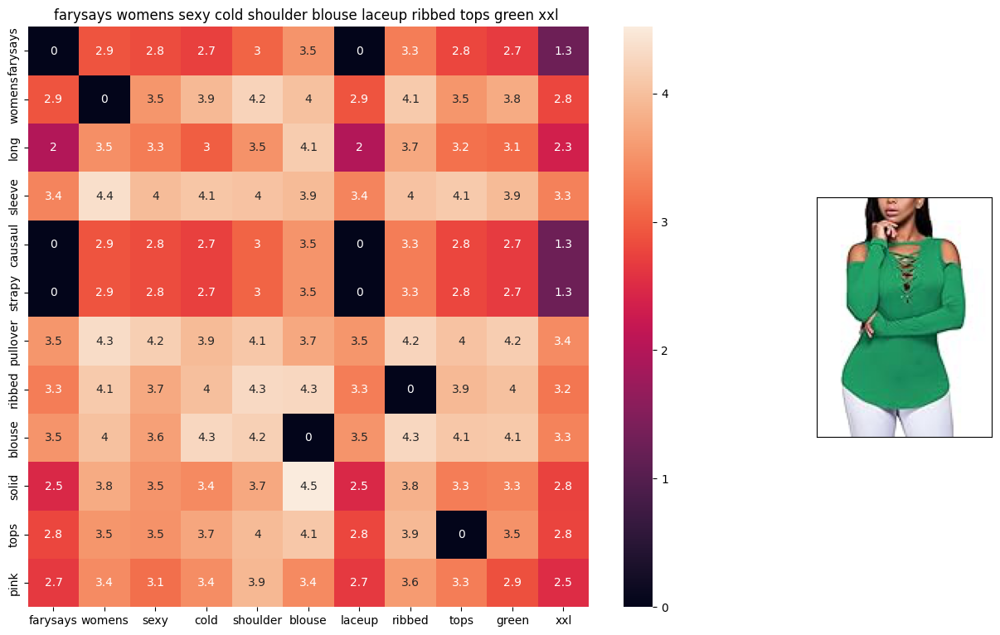

ASIN: B01M7XNEW5
BRAND: FARYSAYS
Euclidean distance from given input image: 0.64164615


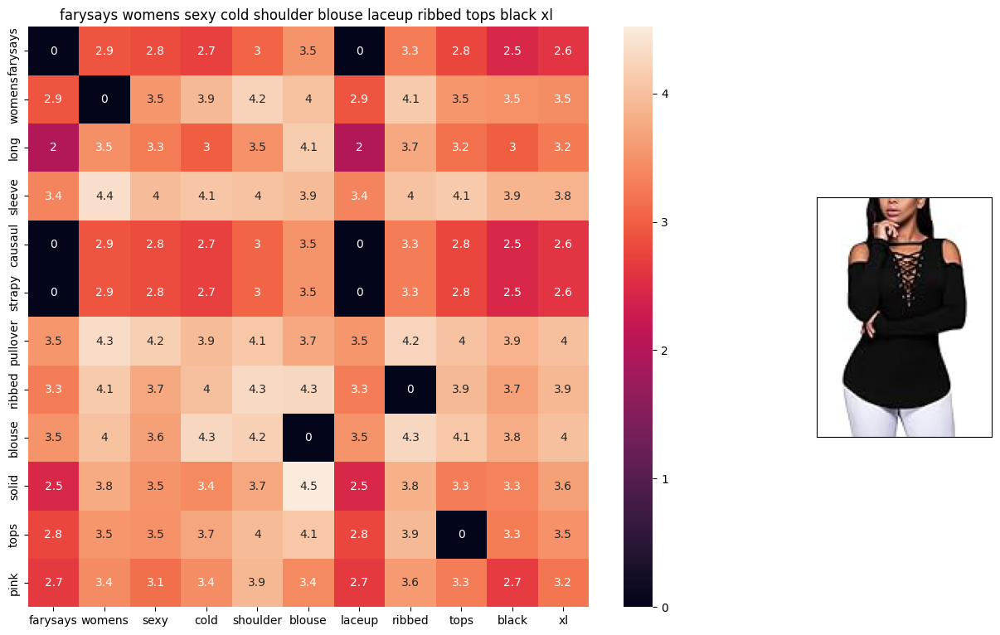

ASIN: B01M4R97JB
BRAND: FARYSAYS
Euclidean distance from given input image: 0.64427686


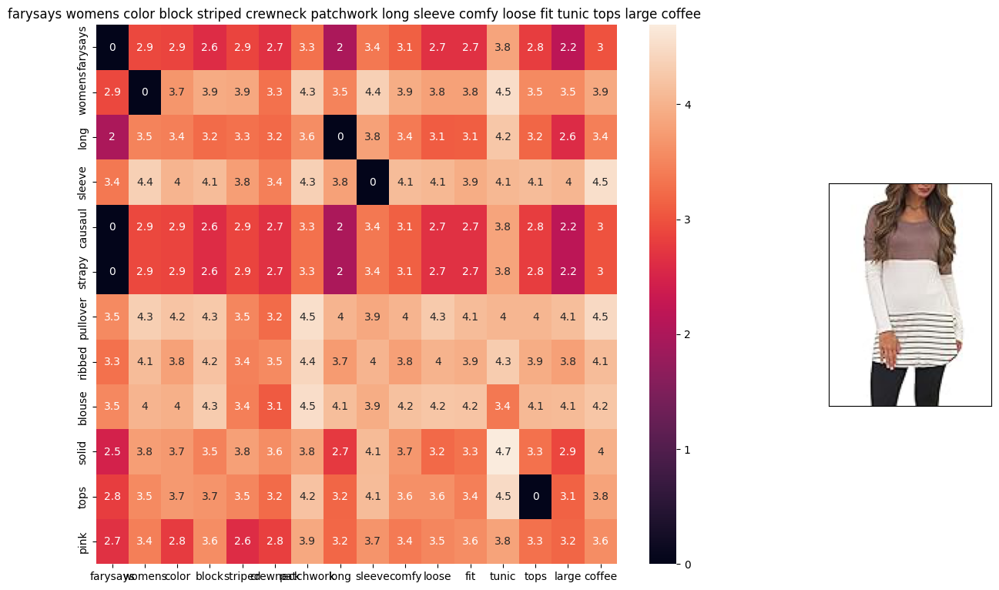

ASIN: B01N1Z7JB7
BRAND: FARYSAYS
Euclidean distance from given input image: 0.6973365


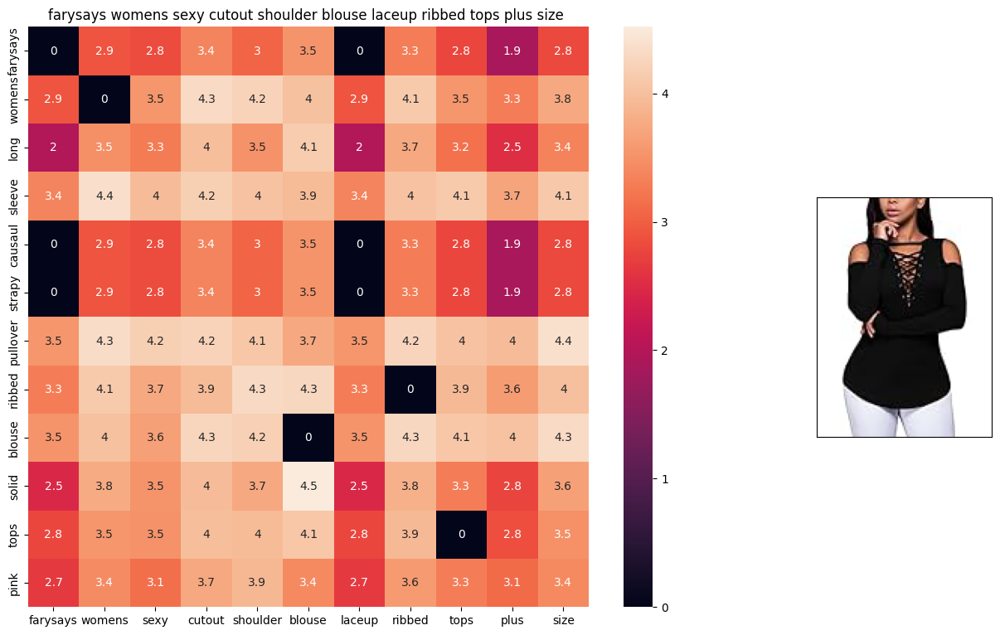

ASIN: B01M9J1FJC
BRAND: FARYSAYS
Euclidean distance from given input image: 0.71980715


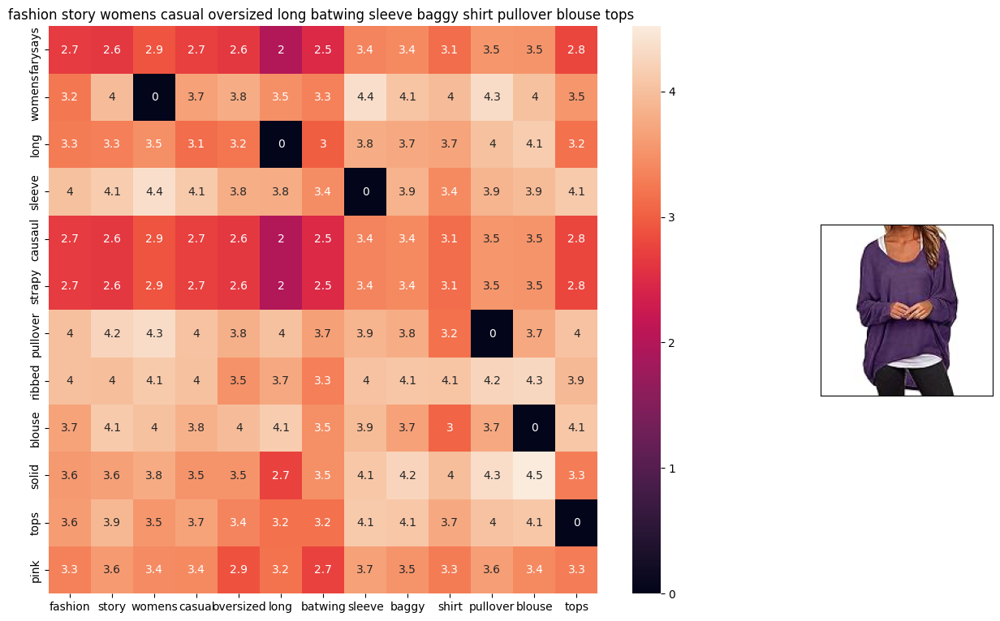

ASIN: B074K8M65J
BRAND: Fashion Story
Euclidean distance from given input image: 0.7221854


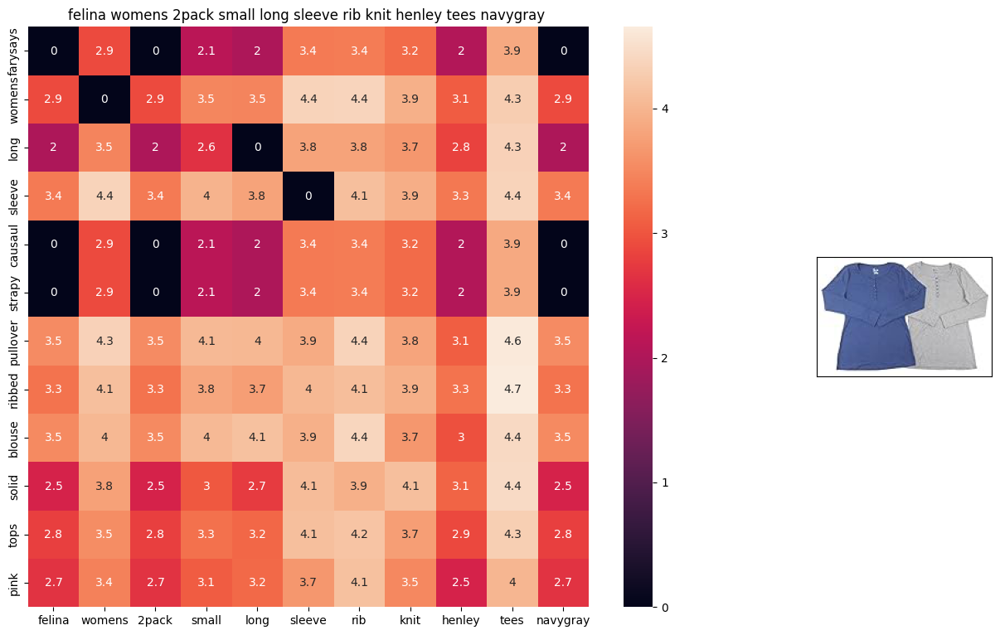

ASIN: B06ZY41SMQ
BRAND: Felina
Euclidean distance from given input image: 0.7372065


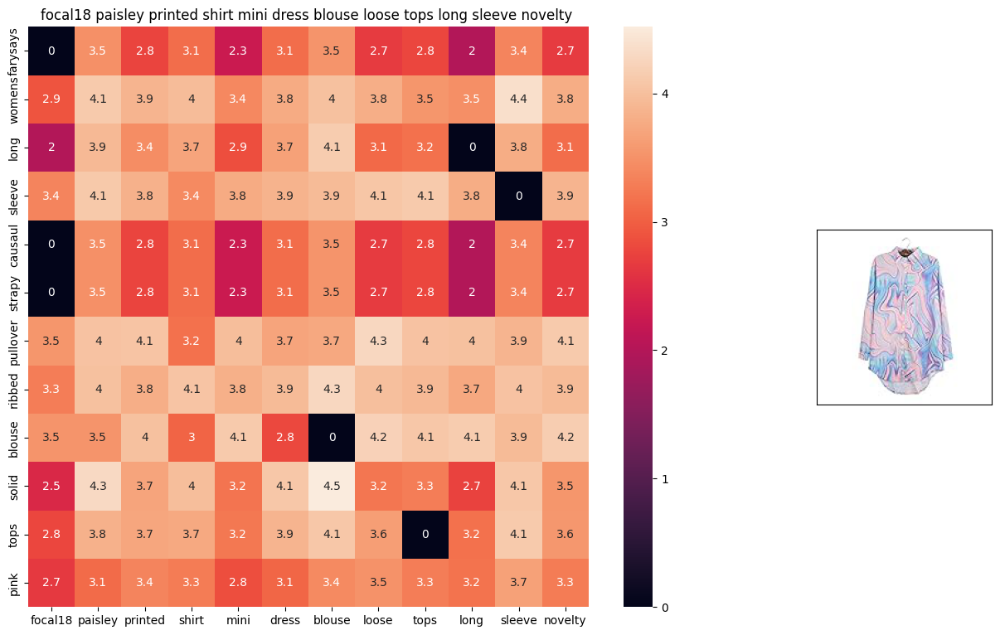

ASIN: B06W56V2N6
BRAND: Focal18
Euclidean distance from given input image: 0.74184436


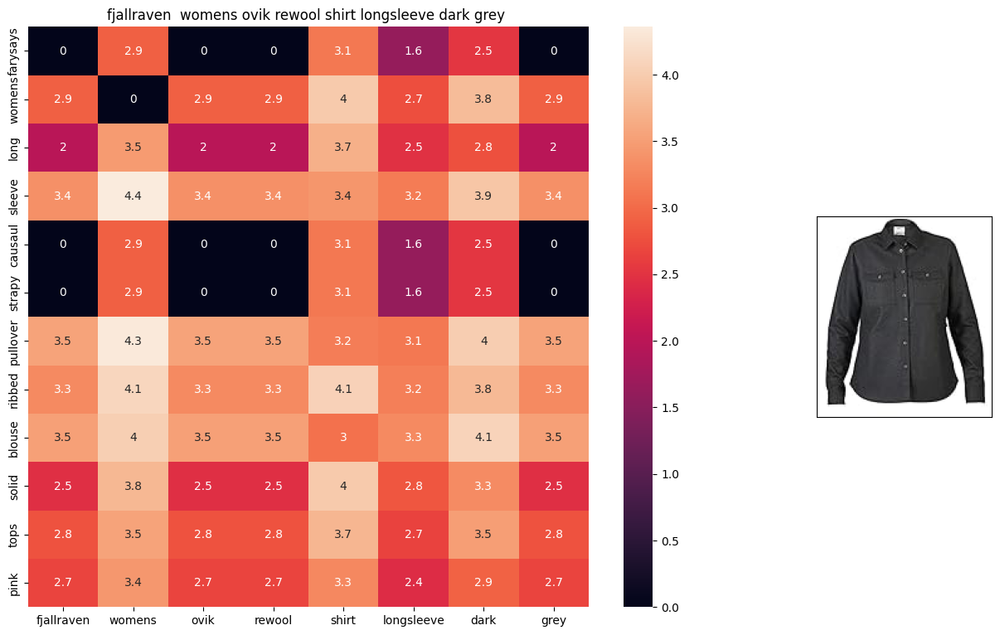

ASIN: B01N7RCYQ4
BRAND: Fjallraven
Euclidean distance from given input image: 0.76016


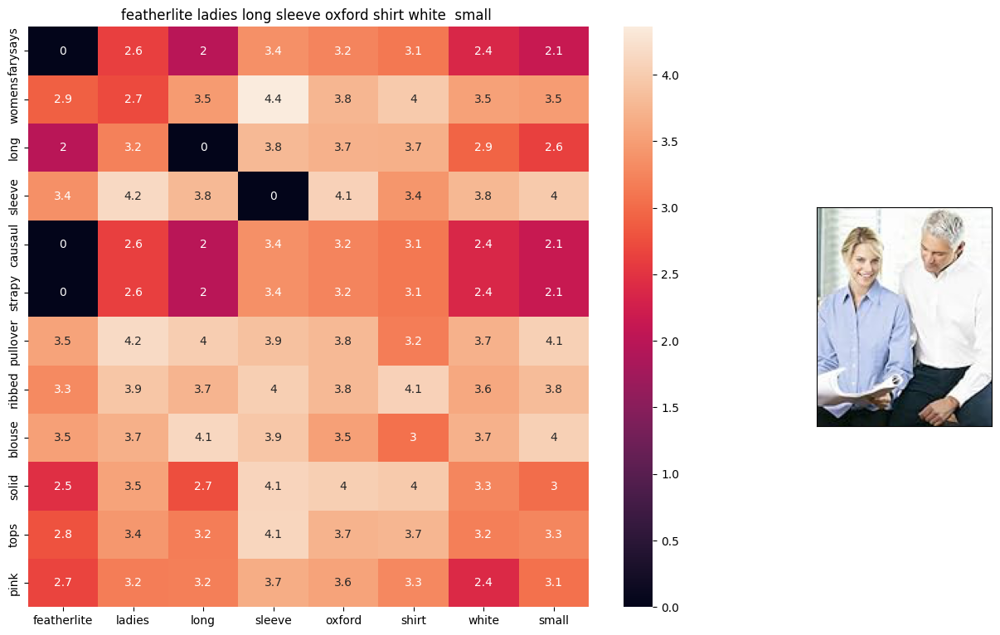

ASIN: B003BSQPX4
BRAND: FeatherLite
Euclidean distance from given input image: 0.762139


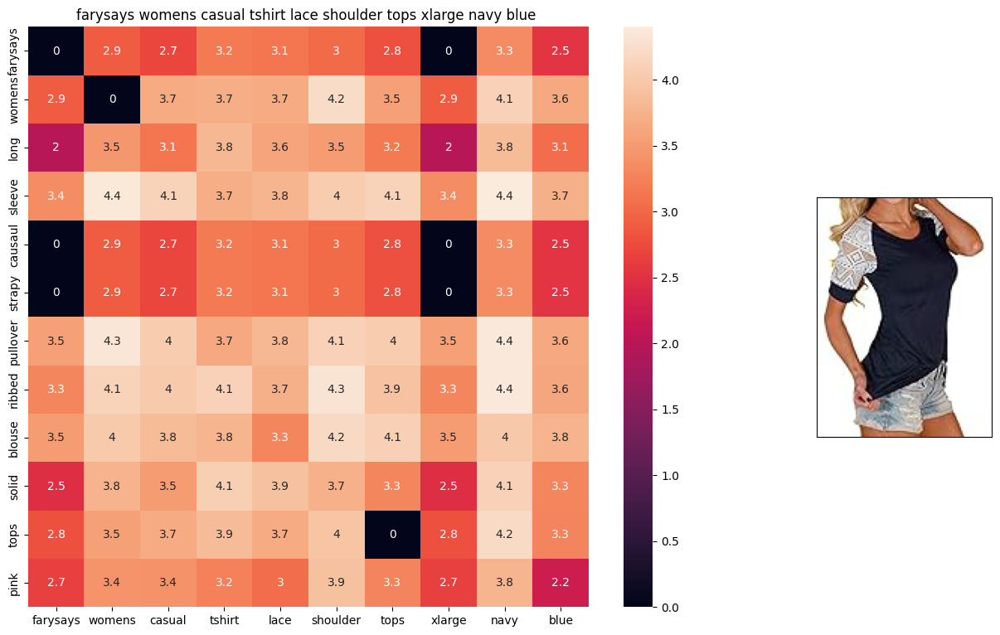

ASIN: B0717BMMV8
BRAND: FARYSAYS
Euclidean distance from given input image: 0.76536274


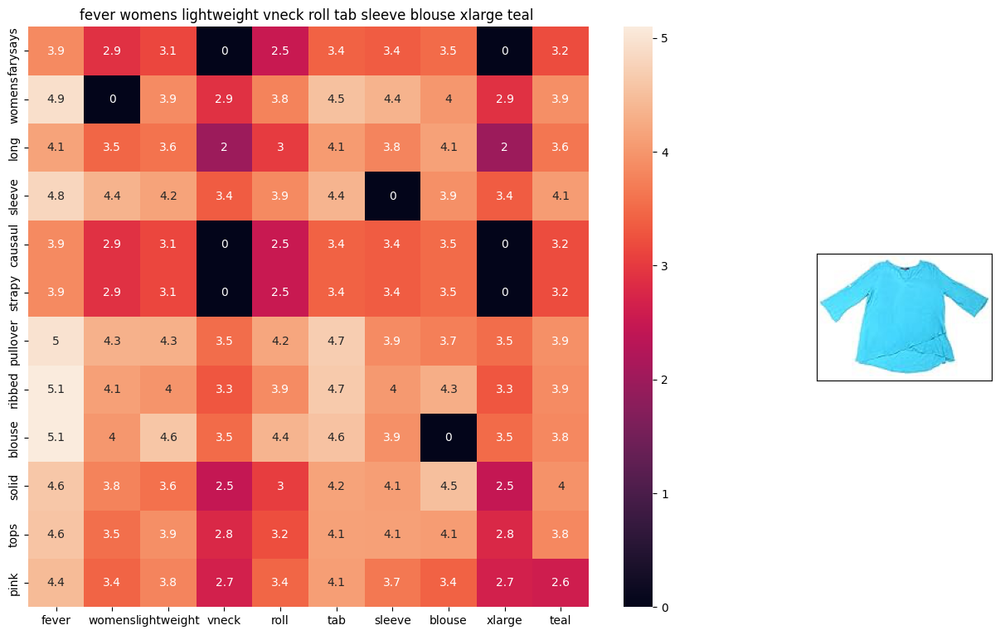

ASIN: B06XRTQTL6
BRAND: Fever
Euclidean distance from given input image: 0.7713507


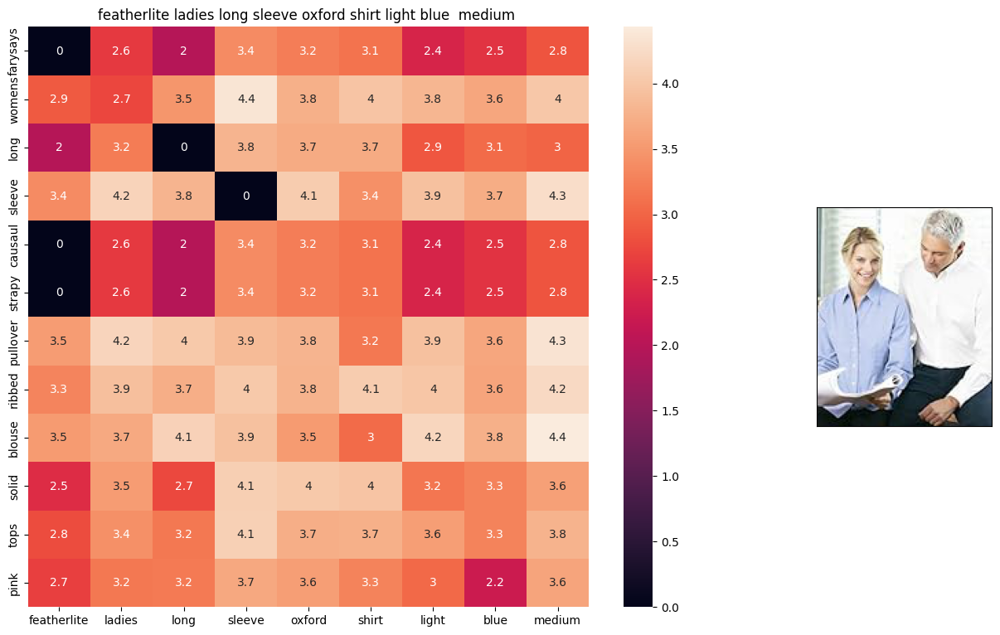

ASIN: B003BSSIVG
BRAND: FeatherLite
Euclidean distance from given input image: 0.78058565


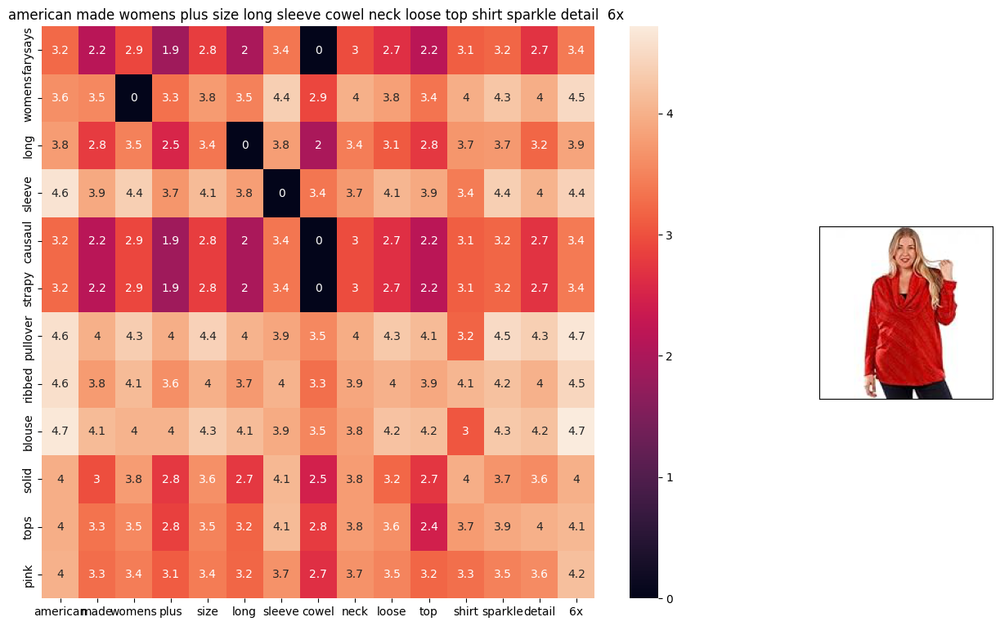

ASIN: B01MAWUZB7
BRAND: Fifth Degree
Euclidean distance from given input image: 0.789773


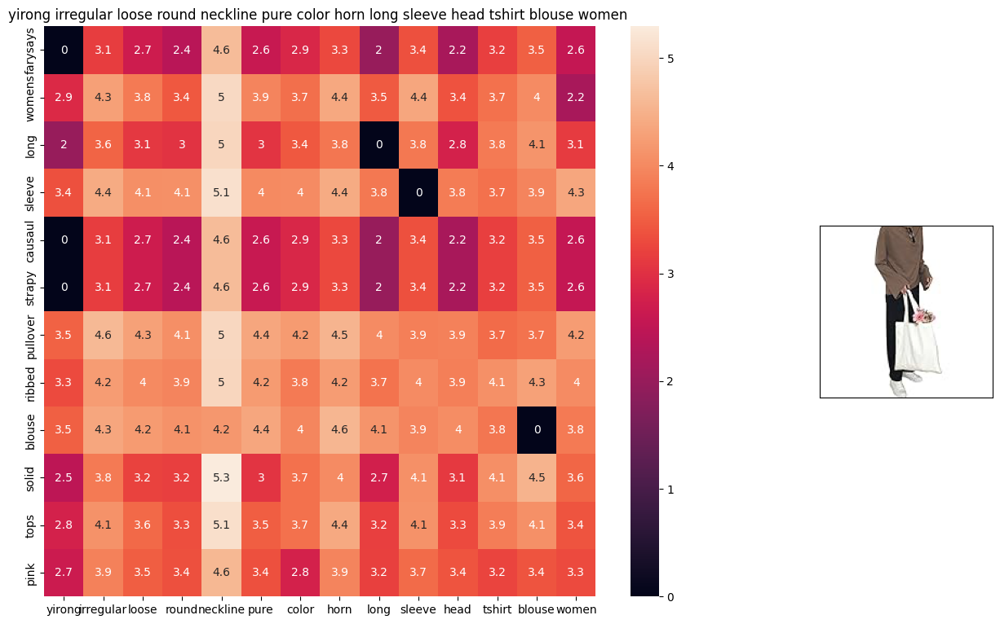

ASIN: B075CG1KY3
BRAND: YiRong Fashion T-Shirt
Euclidean distance from given input image: 0.7912559


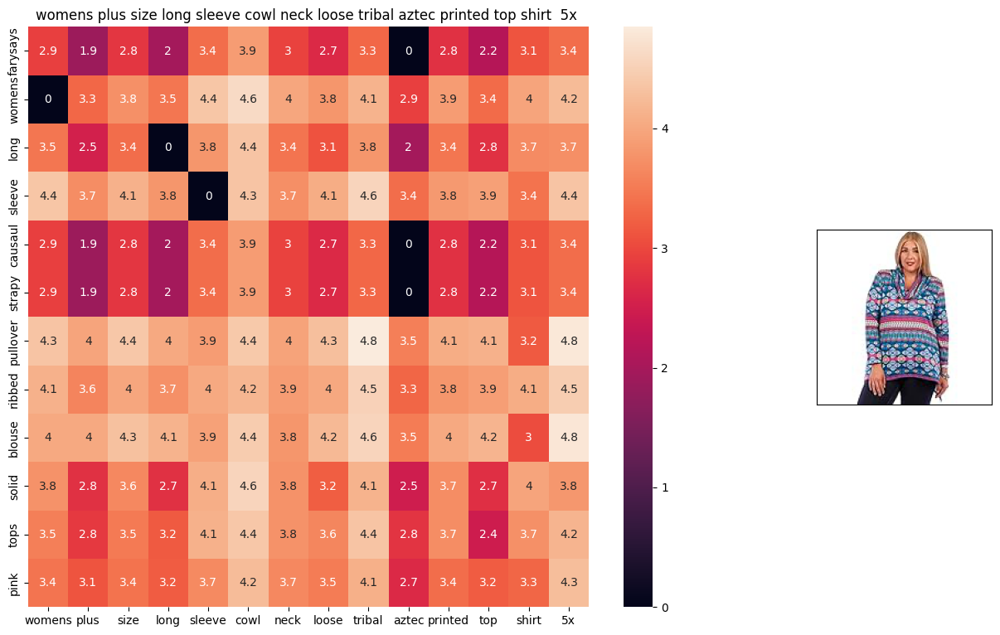

ASIN: B01MXS9W5W
BRAND: Fifth Degree USA
Euclidean distance from given input image: 0.7924101


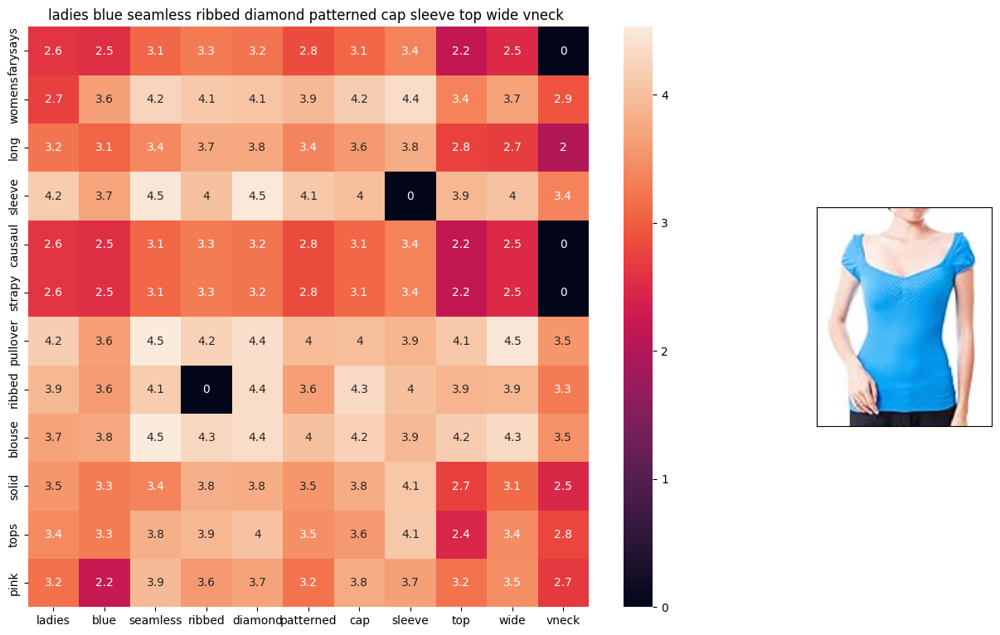

ASIN: B00480IRPI
BRAND: FineBrandShop
Euclidean distance from given input image: 0.8097603


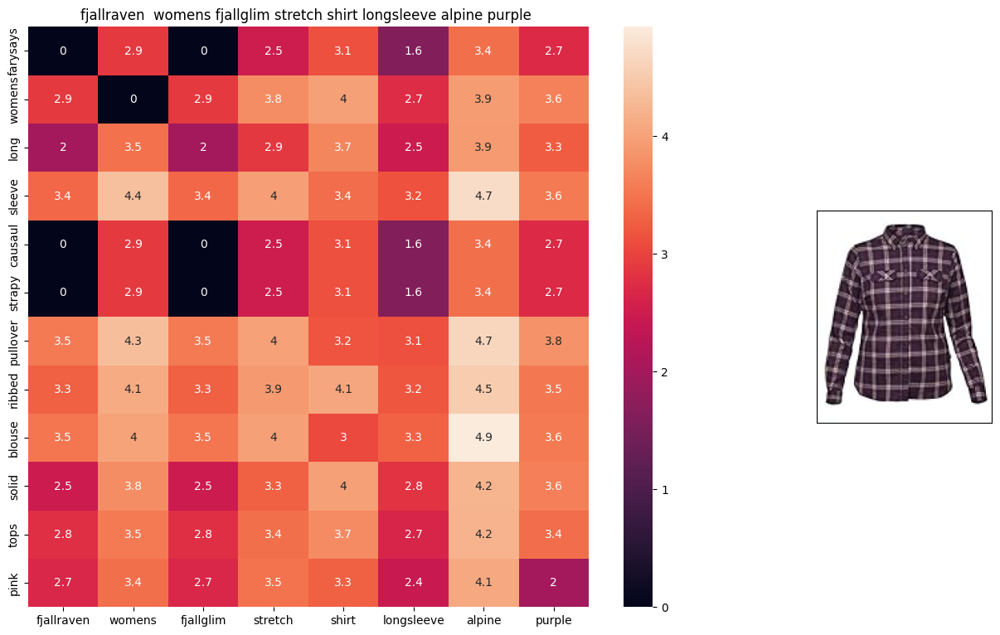

ASIN: B073RV3H1L
BRAND: Fjallraven
Euclidean distance from given input image: 0.8130285


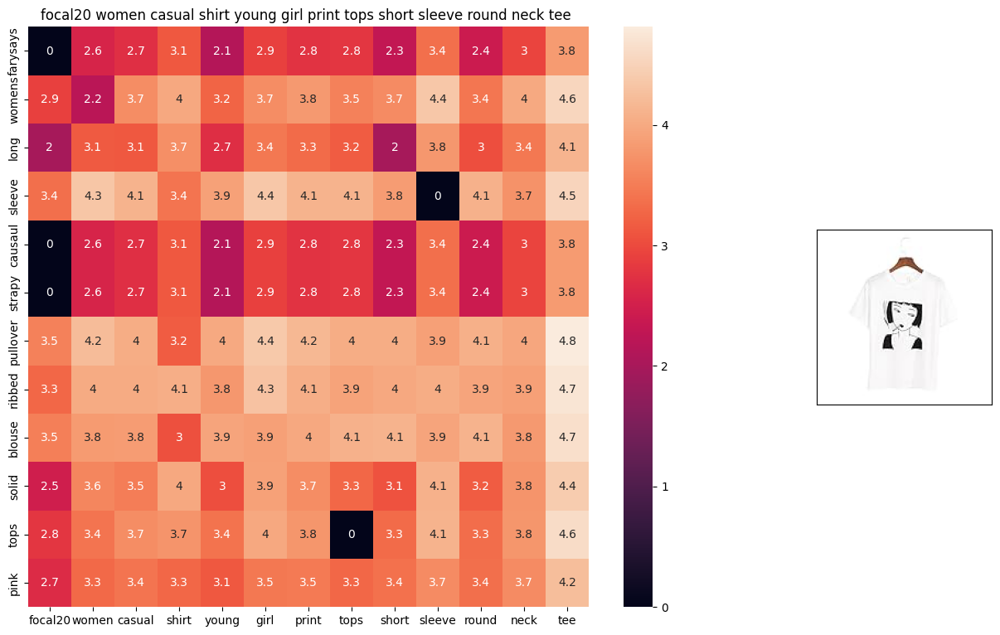

ASIN: B06X9STVVK
BRAND: Focal20
Euclidean distance from given input image: 0.81442714


In [56]:
def avg_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in given corpus
    
    # Calculate pairwise distances
    pairwise_dist = pairwise_distances(w2v_title, w2v_title[doc_id].reshape(1, -1))

    # Get indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[:num_results]
    
    # Store the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[:num_results]

    # Data frame indices of the smallest distances
    df_indices = list(data.index[indices])
    
    for i in range(len(indices)):
        # Create heatmap for the current index
        heat_map_w2v(data['title'].loc[df_indices[0]], 
                      data['title'].loc[df_indices[i]], 
                      data['medium_image_url'].loc[df_indices[i]], 
                      indices[0], 
                      indices[i], 
                      'avg')
        
        # Print details for the recommended apparel
        print('ASIN:', data['asin'].loc[df_indices[i]])
        print('BRAND:', data['brand'].loc[df_indices[i]])
        print('Euclidean distance from given input image:', pdists[i])
        print('=' * 125)

# Call the function with the desired document ID and number of results
avg_w2v_model(120, 20)


### [9.4]  IDF weighted Word2Vec for product similarity

In [57]:
doc_id = 0
w2v_title_weight = []
# for every title we build a weighted vector representation
for i in data['title']:
    w2v_title_weight.append(build_avg_vec(i, 300, doc_id,'weighted'))
    doc_id += 1
# w2v_title = np.array(# number of doc in courpus * 300), each row corresponds to a doc 
w2v_title_weight = np.array(w2v_title_weight)

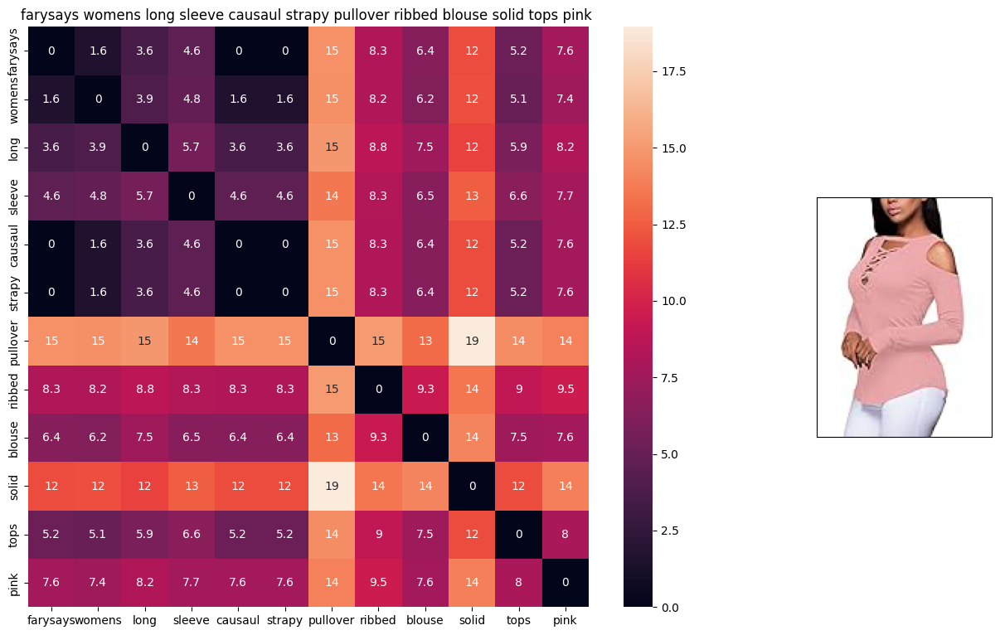

ASIN: B01MRE4Q1O
Brand: FARYSAYS
Euclidean distance from input: 0.0


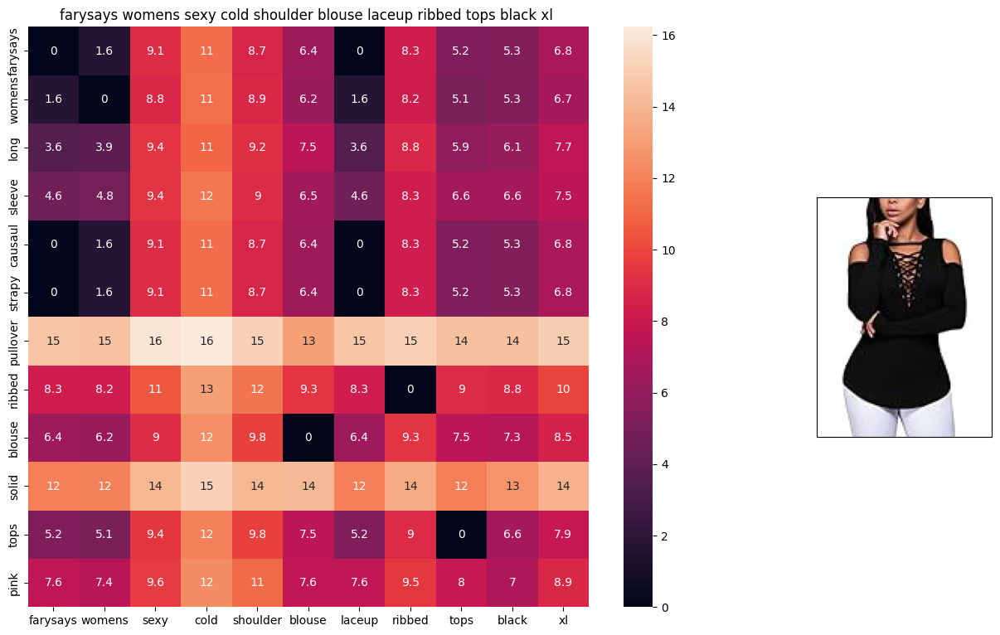

ASIN: B01M4R97JB
Brand: FARYSAYS
Euclidean distance from input: 2.0426953


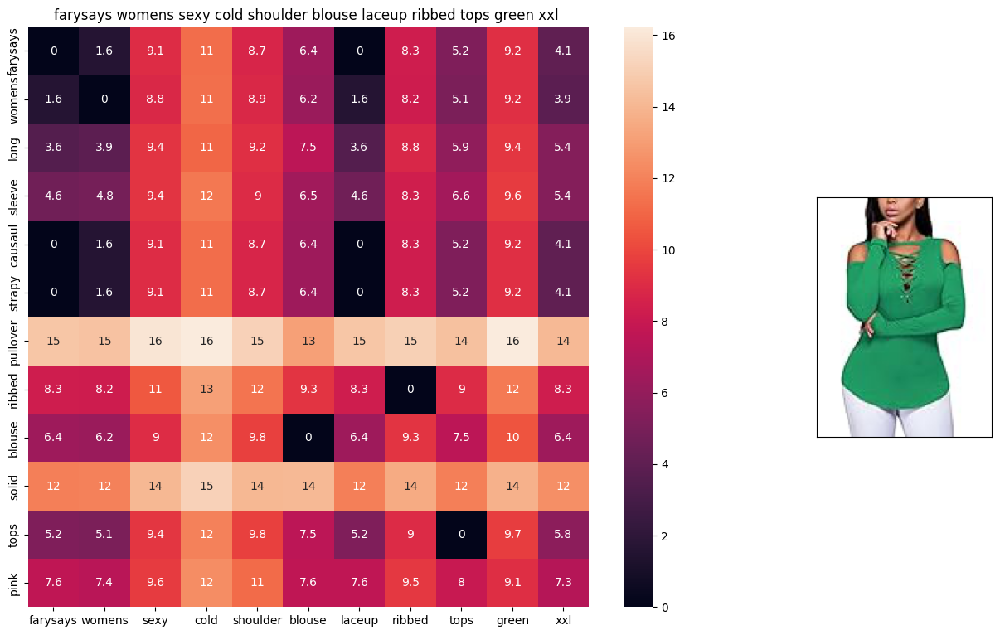

ASIN: B01M7XNEW5
Brand: FARYSAYS
Euclidean distance from input: 2.1098804


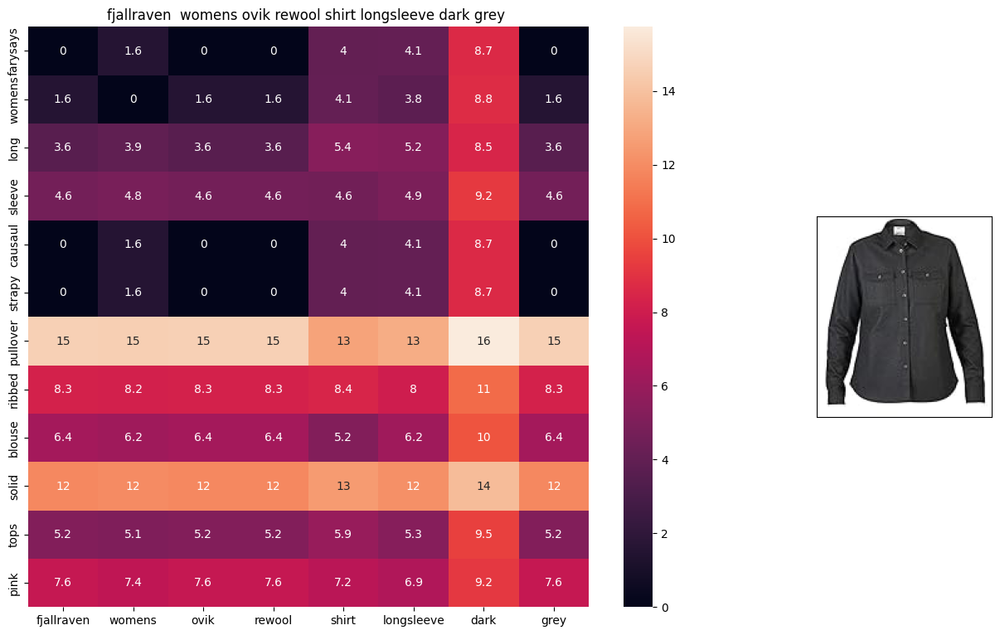

ASIN: B01N7RCYQ4
Brand: Fjallraven
Euclidean distance from input: 2.244773


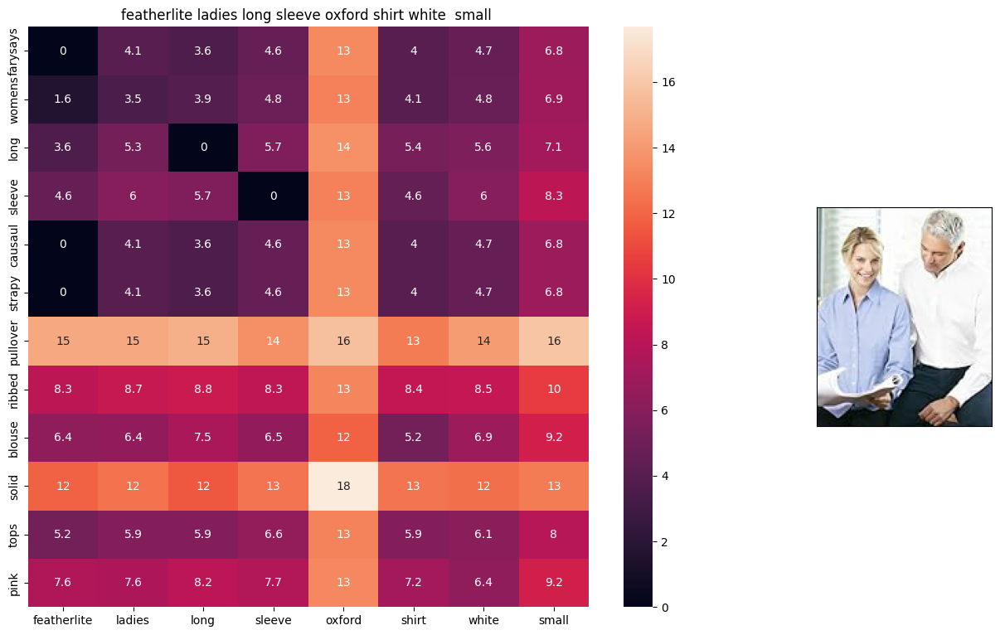

ASIN: B003BSQPX4
Brand: FeatherLite
Euclidean distance from input: 2.2716386


In [58]:
def weighted_w2v_model(doc_id, num_results):
    # doc_id: apparel's id in the given corpus
    
    # Calculate pairwise distances using cosine similarity
    pairwise_dist = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1, -1))

    # Get indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[:num_results]
    
    # Store the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[:num_results]

    # Data frame indices of the smallest distances
    df_indices = list(data.index[indices])
    
    for i in range(len(indices)):
        # Create heatmap for the current index
        heat_map_w2v(data['title'].loc[df_indices[0]], 
                      data['title'].loc[df_indices[i]], 
                      data['medium_image_url'].loc[df_indices[i]], 
                      indices[0], 
                      indices[i], 
                      'weighted')
        
        # Print details for the recommended apparel
        print('ASIN:', data['asin'].loc[df_indices[i]])
        print('Brand:', data['brand'].loc[df_indices[i]])
        print('Euclidean distance from input:', pdists[i])
        print('=' * 125)

# Call the function with the desired document ID and number of results
weighted_w2v_model(120, 5)


### Weighted similarity using brand and color.

In [59]:
# some of the brand values are empty. 
# Need to replace Null with string "NULL"
data['brand'].fillna(value="Not given", inplace=True )

# replace spaces with hypen
brands = [x.replace(" ", "-") for x in data['brand'].values]
types = [x.replace(" ", "-") for x in data['product_type_name'].values]
colors = [x.replace(" ", "-") for x in data['color'].values]

brand_vectorizer = CountVectorizer()
brand_features = brand_vectorizer.fit_transform(brands)

type_vectorizer = CountVectorizer()
type_features = type_vectorizer.fit_transform(types)

color_vectorizer = CountVectorizer()
color_features = color_vectorizer.fit_transform(colors)

extra_features = hstack((brand_features, type_features, color_features)).tocsr()

In [60]:
def heat_map_w2v_brand(sentance1, sentance2, url, doc_id1, doc_id2, df_id1, df_id2, model):
    
    # sentance1 : title1, input apparel
    # sentance2 : title2, recommended apparel
    # url: apparel image url
    # doc_id1: document id of input apparel
    # doc_id2: document id of recommended apparel
    # df_id1: index of document1 in the data frame
    # df_id2: index of document2 in the data frame
    # model: it can have two values, 1. avg 2. weighted
    
    # Get word vectors
    s1_vec = get_word_vec(sentance1, doc_id1, model)
    s2_vec = get_word_vec(sentance2, doc_id2, model)
    
    # Calculate distances
    s1_s2_dist = get_distance(s1_vec, s2_vec)

    # Create data matrix for table
    data_matrix = [['Asin', 'Brand', 'Color', 'Product type'],
                   [data['asin'].loc[df_id1], brands[doc_id1], colors[doc_id1], types[doc_id1]], 
                   [data['asin'].loc[df_id2], brands[doc_id2], colors[doc_id2], types[doc_id2]]]
    
    colorscale = [[0, '#1d004d'], [.5, '#f2e5ff'], [1, '#f2e5d1']]  # Color headings
    
    # Create table with plotly
    table = ff.create_table(data_matrix, index=True, colorscale=colorscale)
    plotly.offline.iplot(table, filename='simple_table')
    
    # Set up figure with gridspec
    gs = gridspec.GridSpec(25, 15)
    fig = plt.figure(figsize=(25, 5))
    
    # Plot heatmap
    ax1 = plt.subplot(gs[:, :-5])
    ax1 = sns.heatmap(np.round(s1_s2_dist, 6), annot=True)

    # Set tick locations and labels
    ax1.set_xticks(np.arange(len(sentance2.split())))
    ax1.set_yticks(np.arange(len(sentance1.split())))
    
    # Set x and y axis labels
    ax1.set_xticklabels(sentance2.split(), rotation=45)
    ax1.set_yticklabels(sentance1.split(), rotation=0)
    
    # Set title
    ax1.set_title(sentance2)

    # Display image
    ax2 = plt.subplot(gs[:, 10:16])
    ax2.grid(False)
    ax2.set_xticks([])
    ax2.set_yticks([])
    
    # Display the image from the URL
    display_img(url, ax2, fig)
    
    plt.show()


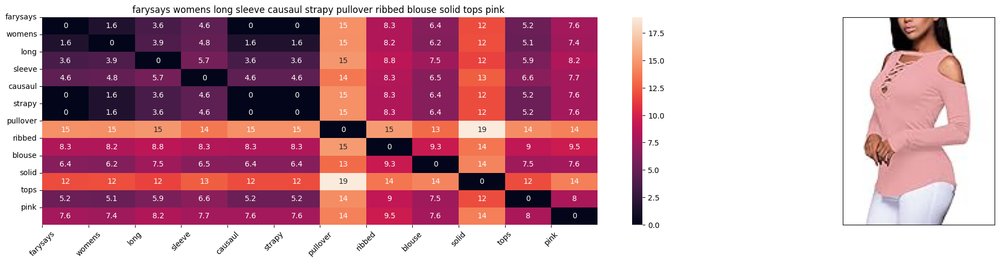

ASIN : B01MRE4Q1O
Brand : FARYSAYS
euclidean distance from input : 0.0


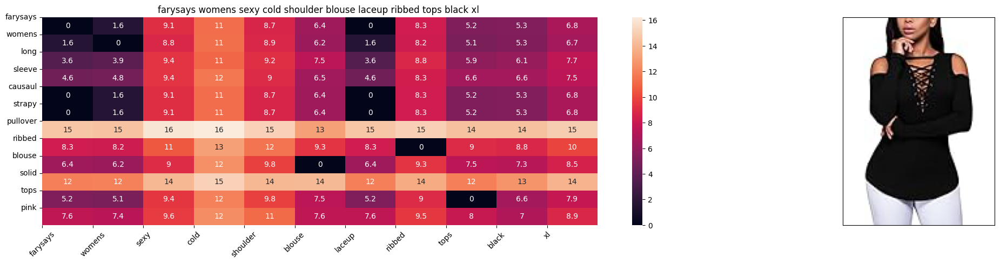

ASIN : B01M4R97JB
Brand : FARYSAYS
euclidean distance from input : 1.728454399289575


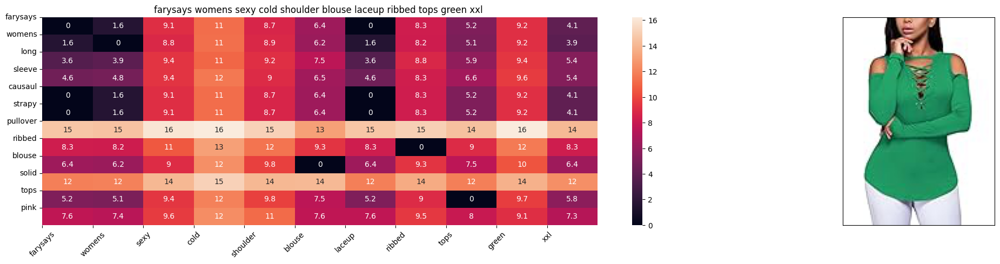

ASIN : B01M7XNEW5
Brand : FARYSAYS
euclidean distance from input : 1.7620470048803951


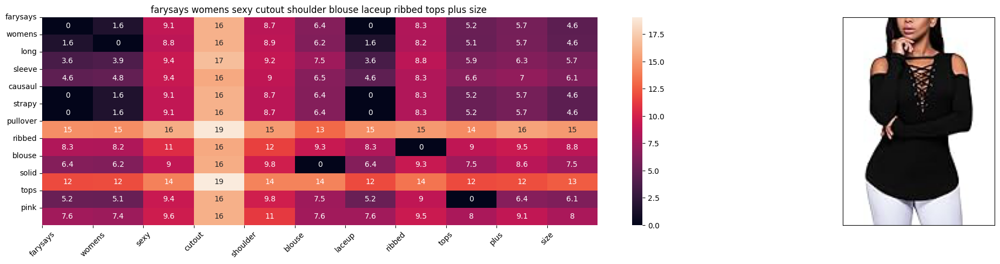

ASIN : B01M9J1FJC
Brand : FARYSAYS
euclidean distance from input : 1.8740970613379146


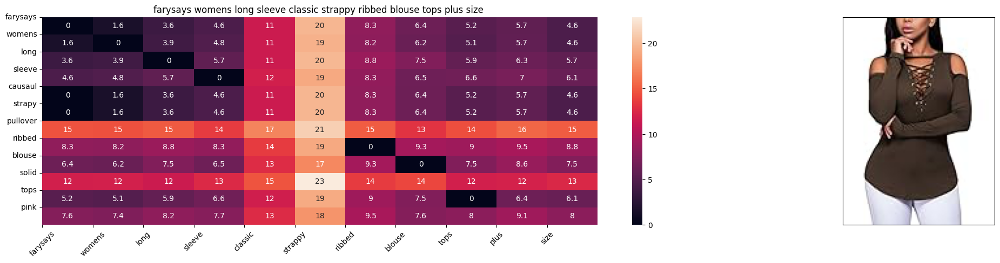

ASIN : B01MQD2T92
Brand : FARYSAYS
euclidean distance from input : 1.8916460039038328


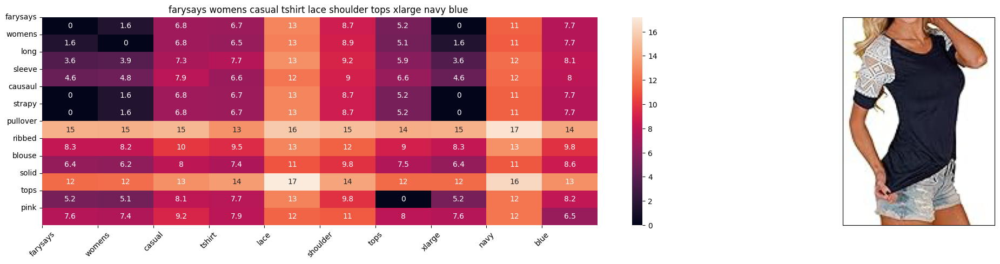

ASIN : B0717BMMV8
Brand : FARYSAYS
euclidean distance from input : 2.305613048350725


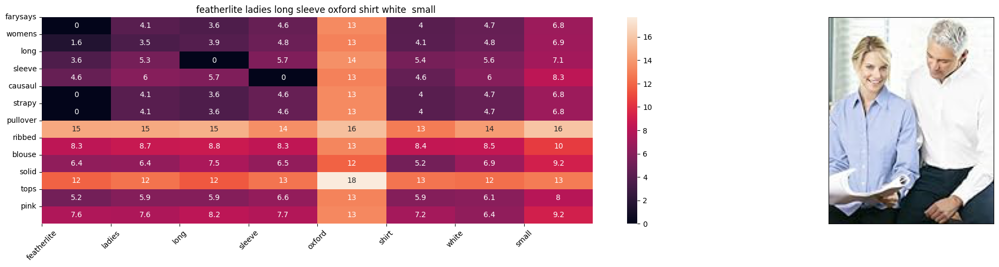

ASIN : B003BSQPX4
Brand : FeatherLite
euclidean distance from input : 2.360564211143786


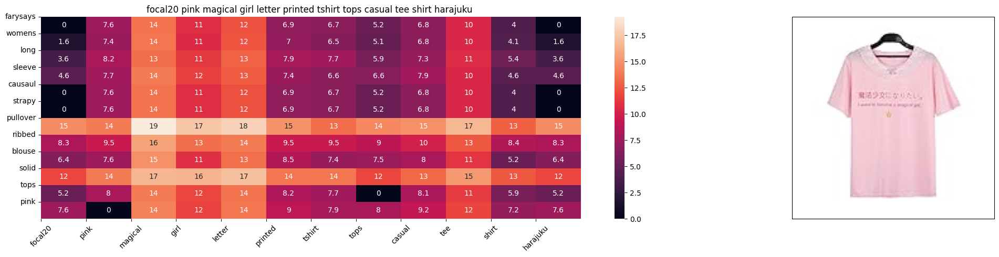

ASIN : B06XD96QDW
Brand : Focal20
euclidean distance from input : 2.366494655609131


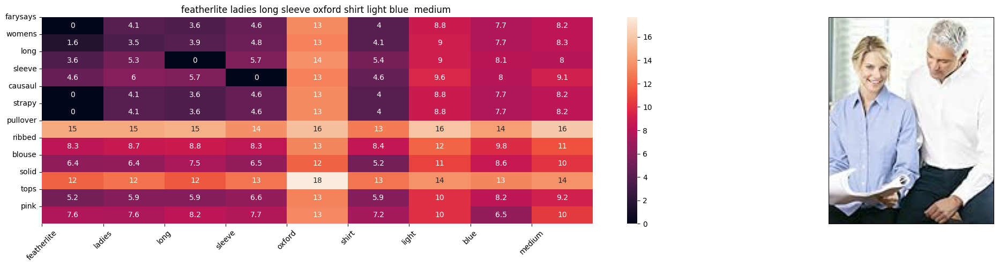

ASIN : B003BSSIVG
Brand : FeatherLite
euclidean distance from input : 2.4085489065783565


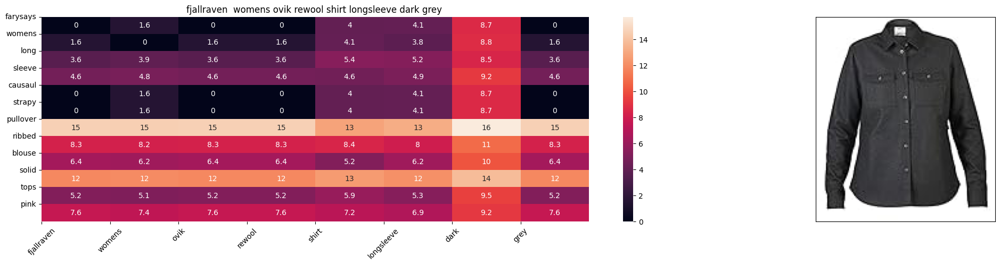

ASIN : B01N7RCYQ4
Brand : Fjallraven
euclidean distance from input : 2.445262111068184


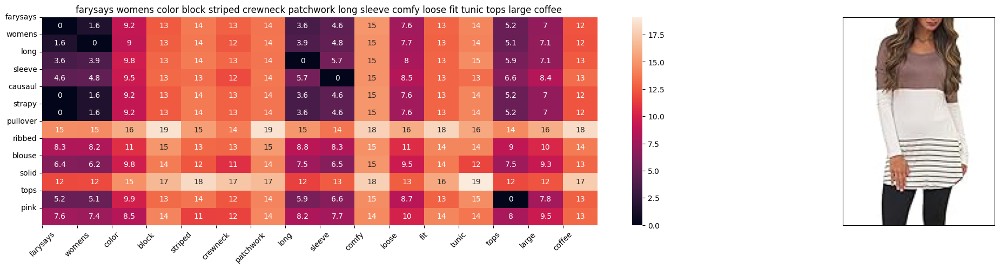

ASIN : B01N1Z7JB7
Brand : FARYSAYS
euclidean distance from input : 2.4812822341918945


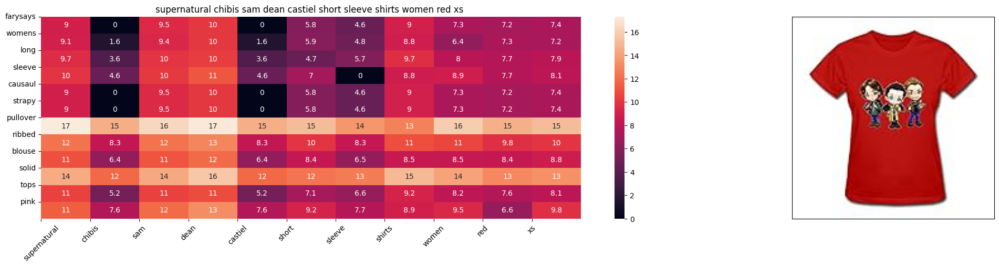

ASIN : B014ICBSE2
Brand : FNC7C
euclidean distance from input : 2.526896932853991


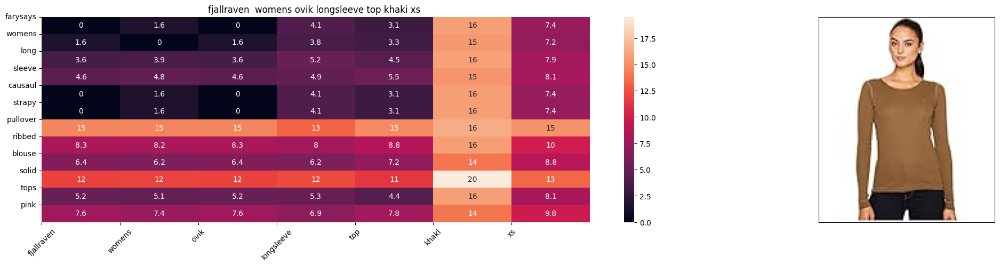

ASIN : B01N21KZNT
Brand : Fjallraven
euclidean distance from input : 2.5400390417712275


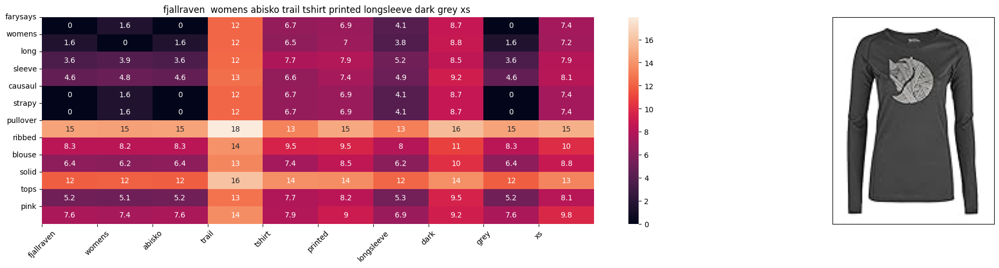

ASIN : B073WKHYC3
Brand : Fjallraven
euclidean distance from input : 2.5401075013880083


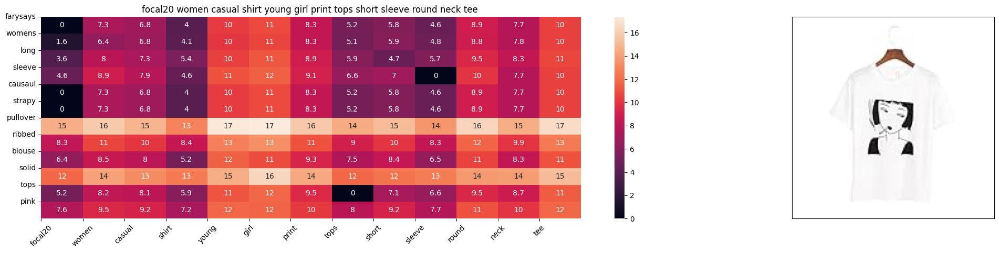

ASIN : B06X9STVVK
Brand : Focal20
euclidean distance from input : 2.5828048498766965


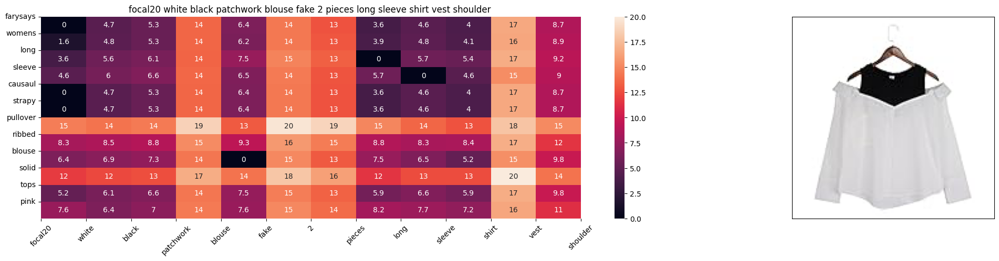

ASIN : B071HLXV6M
Brand : Focal20
euclidean distance from input : 2.6253171713488643


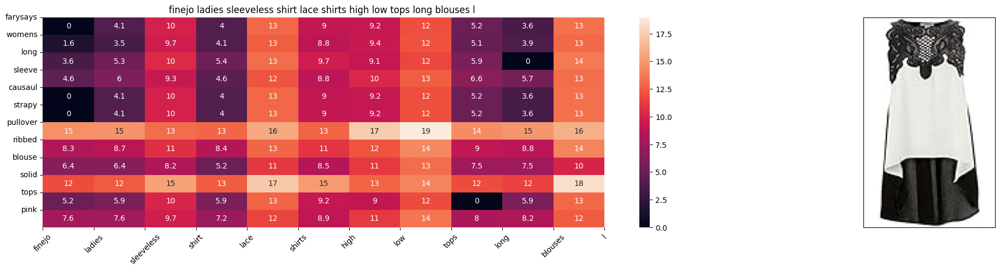

ASIN : B00R7DO9ZA
Brand : Finejo
euclidean distance from input : 2.6270151884692257


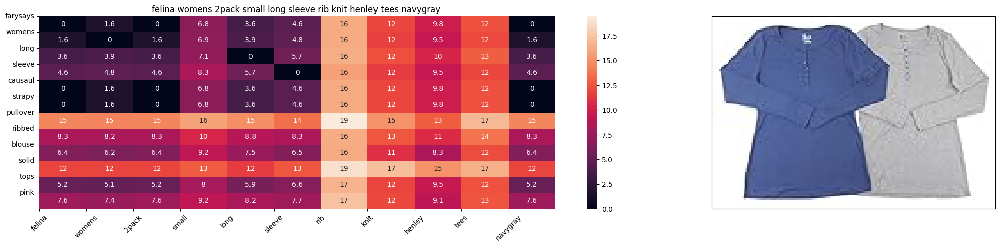

ASIN : B06ZY41SMQ
Brand : Felina
euclidean distance from input : 2.6303521760706254


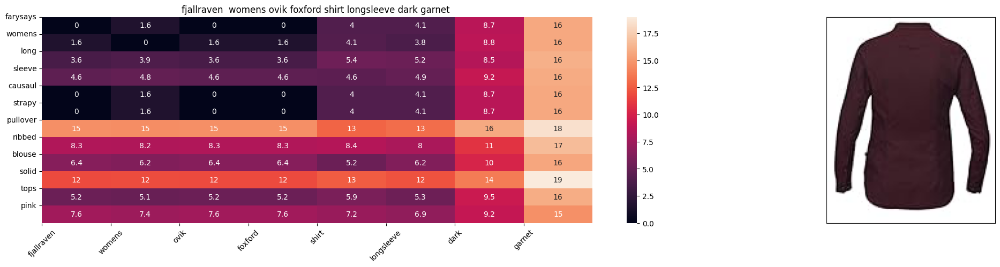

ASIN : B07455KX64
Brand : Fjallraven
euclidean distance from input : 2.6475921281580277


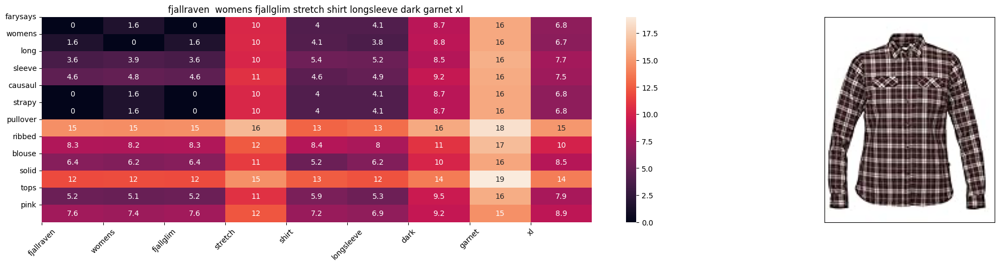

ASIN : B073RVRGLZ
Brand : Fjallraven
euclidean distance from input : 2.651816428542549


In [61]:
def idf_w2v_brand(doc_id, w1, w2, num_results):
    # doc_id: apparel's id in given corpus
    # w1: weight for  w2v features
    # w2: weight for brand and color features
    idf_w2v_dist  = pairwise_distances(w2v_title_weight, w2v_title_weight[doc_id].reshape(1,-1))
    ex_feat_dist = pairwise_distances(extra_features, extra_features[doc_id])
    pairwise_dist   = (w1 * idf_w2v_dist +  w2 * ex_feat_dist)/float(w1 + w2)

    # np.argsort will return indices of 9 smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    #pdists will store the 9 smallest distances
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]

    #data frame indices of the 9 smallest distace's
    df_indices = list(data.index[indices])
    

    for i in range(0, len(indices)):
        heat_map_w2v_brand(data['title'].loc[df_indices[0]],data['title'].loc[df_indices[i]], data['medium_image_url'].loc[df_indices[i]], indices[0], indices[i],df_indices[0], df_indices[i], 'weighted')
        print('ASIN :',data['asin'].loc[df_indices[i]])
        print('Brand :',data['brand'].loc[df_indices[i]])
        print('euclidean distance from input :', pdists[i])
        print('='*125)

idf_w2v_brand(120, 5, 5, 20)
# in the give heat map, each cell contains the euclidean distance between words i, j

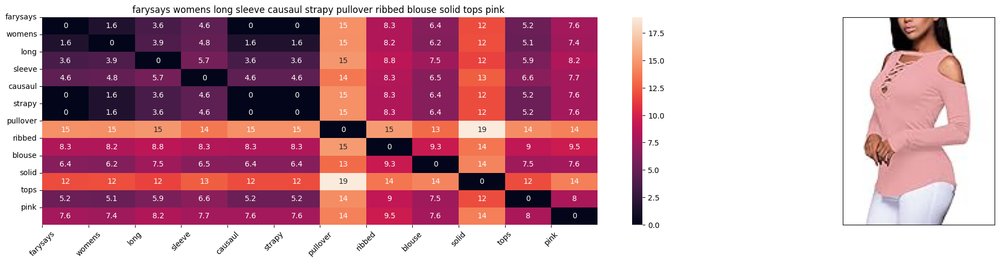

ASIN : B01MRE4Q1O
Brand : FARYSAYS
euclidean distance from input : 0.0


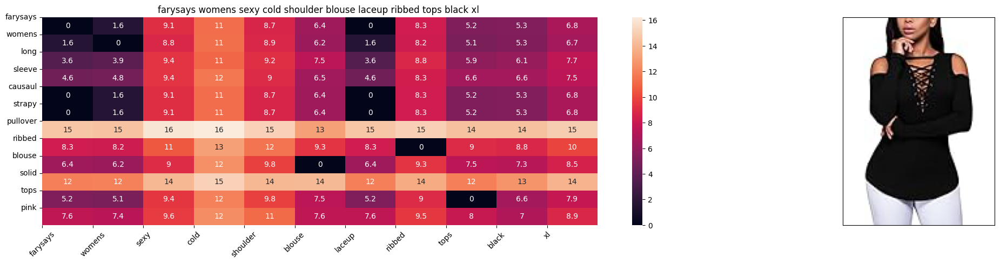

ASIN : B01M4R97JB
Brand : FARYSAYS
euclidean distance from input : 1.4713482599942733


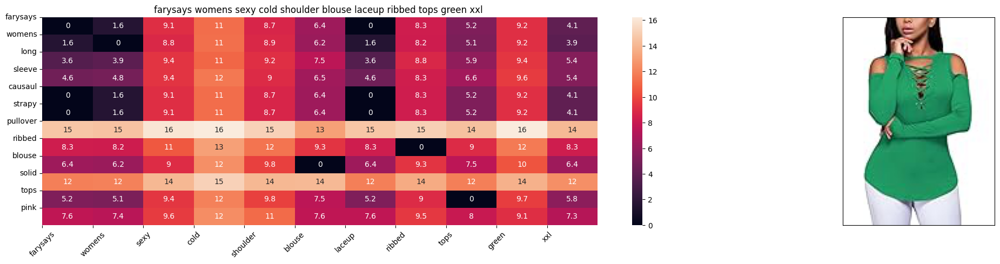

ASIN : B01M7XNEW5
Brand : FARYSAYS
euclidean distance from input : 1.4774560064653315


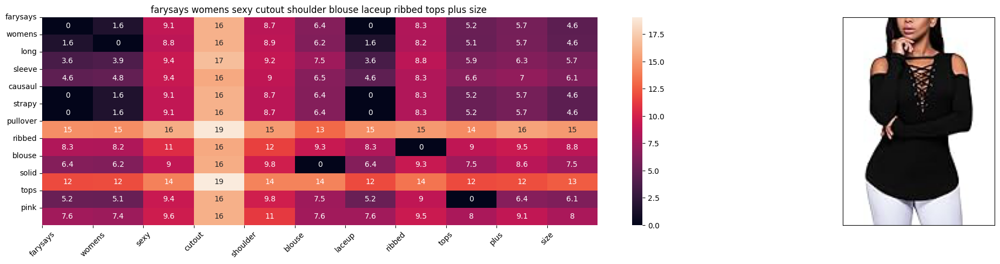

ASIN : B01M9J1FJC
Brand : FARYSAYS
euclidean distance from input : 1.4978287440030622


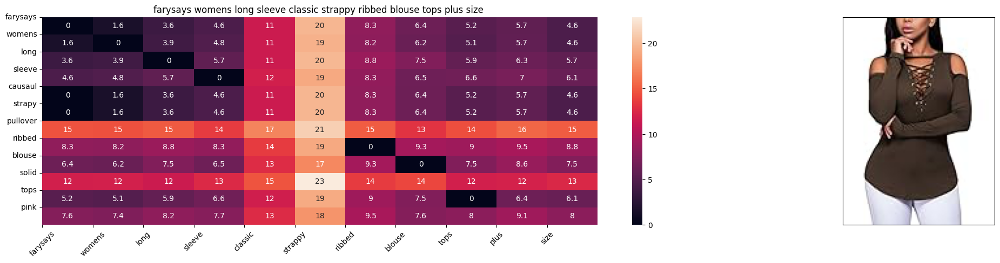

ASIN : B01MQD2T92
Brand : FARYSAYS
euclidean distance from input : 1.5010194608332292


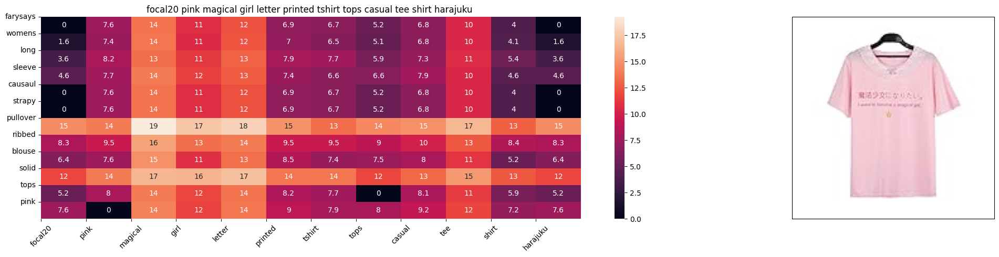

ASIN : B06XD96QDW
Brand : Focal20
euclidean distance from input : 2.066635391928933


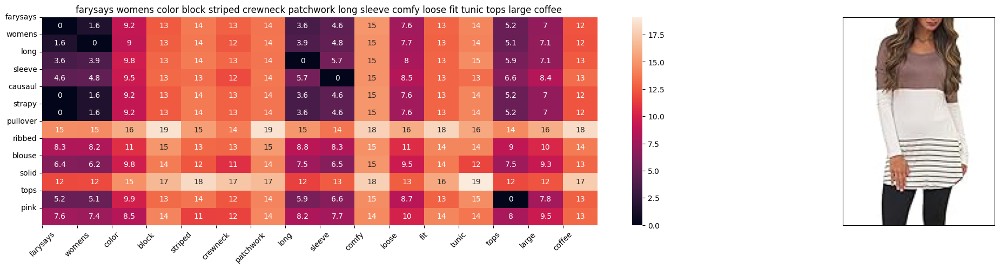

ASIN : B01N1Z7JB7
Brand : FARYSAYS
euclidean distance from input : 2.0875058607621626


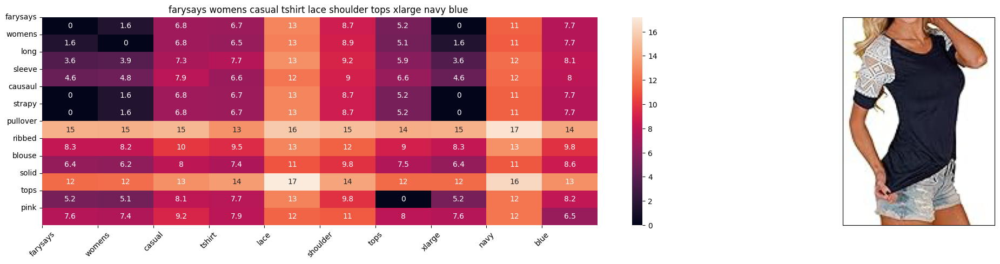

ASIN : B0717BMMV8
Brand : FARYSAYS
euclidean distance from input : 2.248712535836323


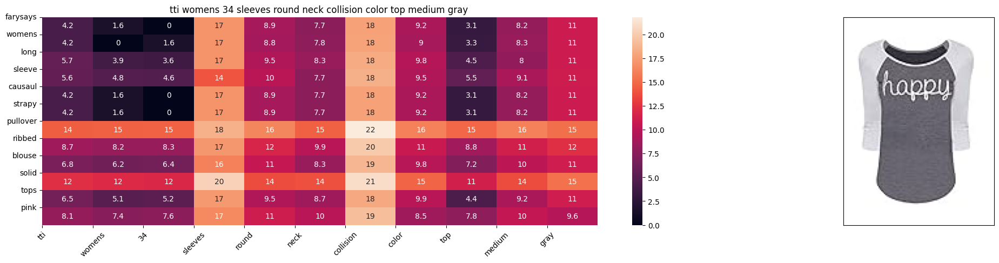

ASIN : B01HIFW750
Brand : FASHION TTI
euclidean distance from input : 2.3116807899256786


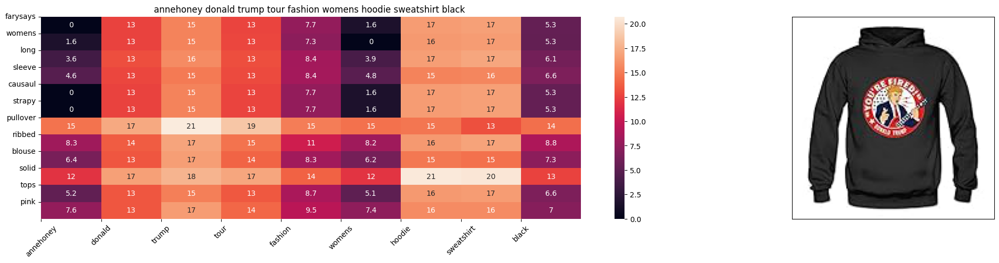

ASIN : B01LYATWSS
Brand : fashion t shirts
euclidean distance from input : 2.3805187707162507


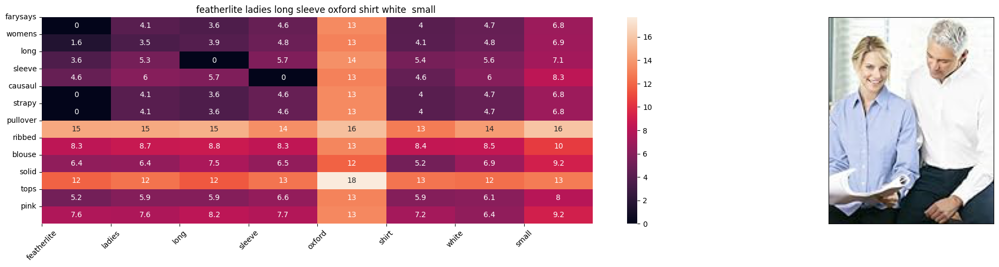

ASIN : B003BSQPX4
Brand : FeatherLite
euclidean distance from input : 2.4333214643032886


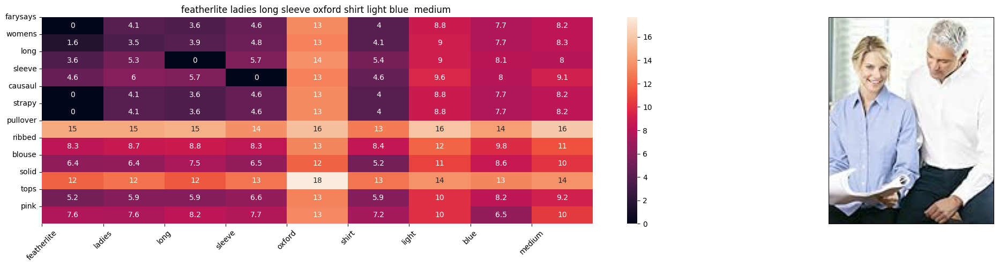

ASIN : B003BSSIVG
Brand : FeatherLite
euclidean distance from input : 2.4420459543823014


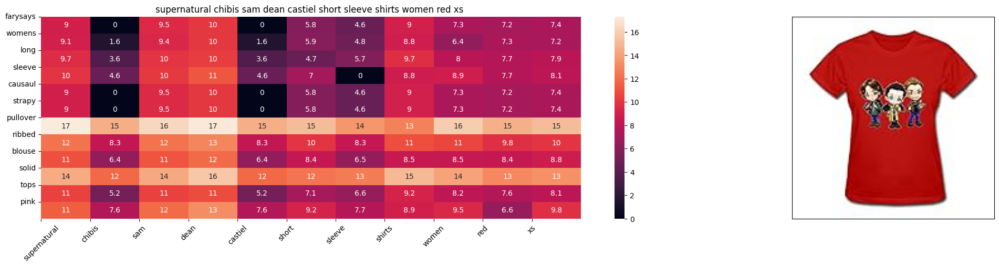

ASIN : B014ICBSE2
Brand : FNC7C
euclidean distance from input : 2.4635637773415078


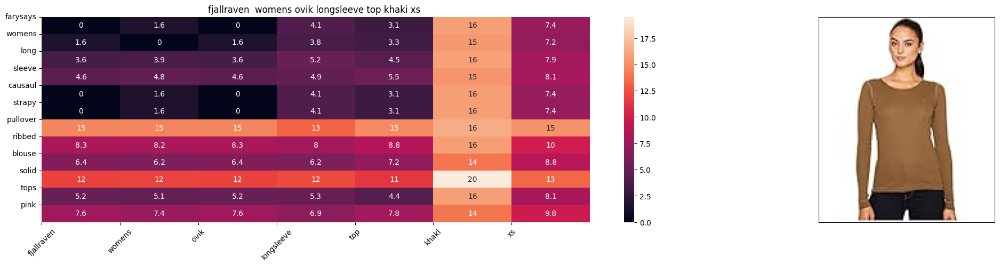

ASIN : B01N21KZNT
Brand : Fjallraven
euclidean distance from input : 2.465953251690096


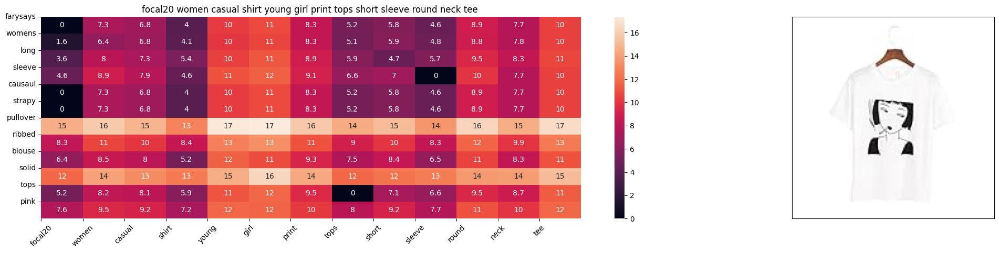

ASIN : B06X9STVVK
Brand : Focal20
euclidean distance from input : 2.4737288531638177


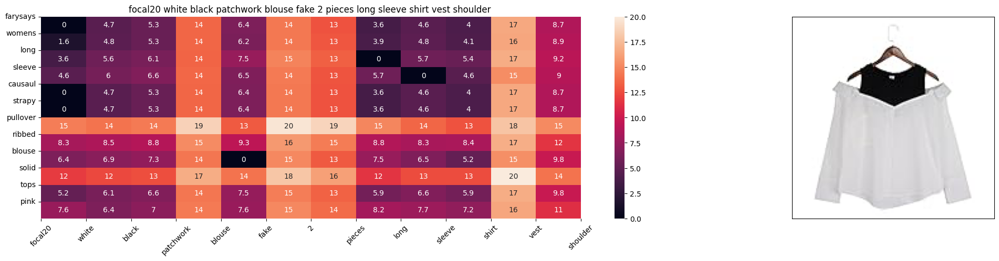

ASIN : B071HLXV6M
Brand : Focal20
euclidean distance from input : 2.4814583661587575


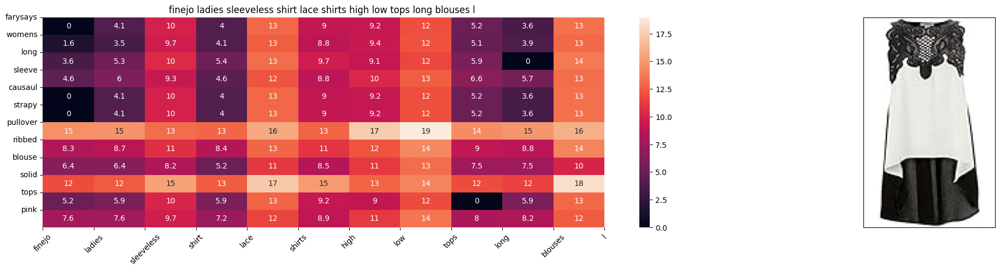

ASIN : B00R7DO9ZA
Brand : Finejo
euclidean distance from input : 2.4817670965442775


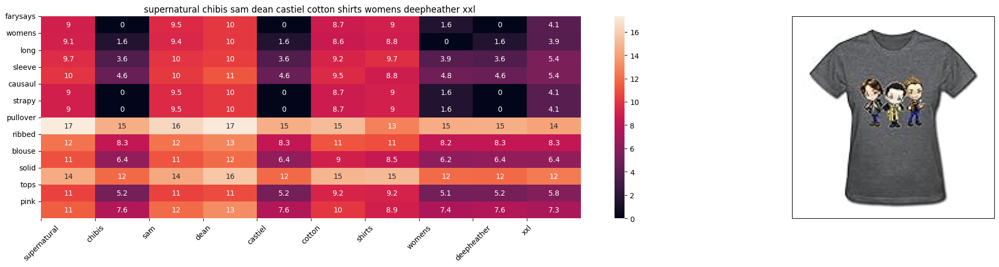

ASIN : B014ICDNZY
Brand : FNC7C
euclidean distance from input : 2.486863098602827


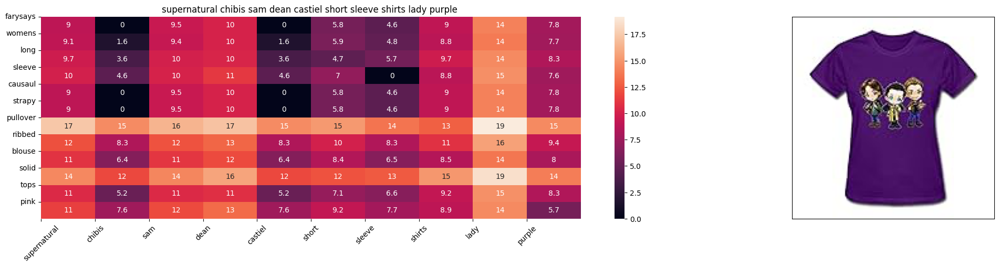

ASIN : B014ICEDNA
Brand : FNC7C
euclidean distance from input : 2.4873355488591744


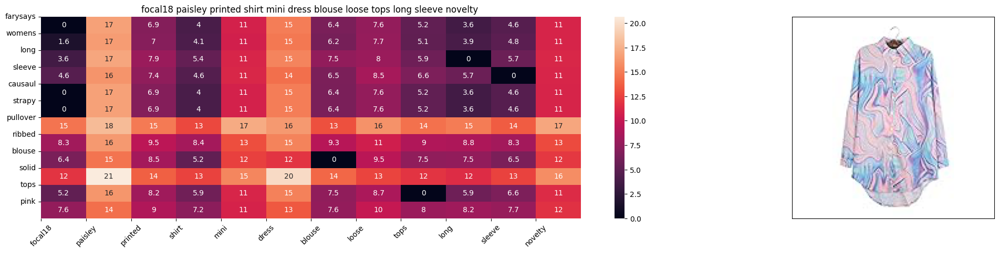

ASIN : B06W56V2N6
Brand : Focal18
euclidean distance from input : 2.4883832554631784


In [62]:
# brand and color weight =50
# title vector weight = 5

idf_w2v_brand(120, 5, 50, 20)